# Data Science Task 1 

This task should allow you to work on both Classification and Regression problems, where your features are highly correlated.To simulate a standard working environment this challenge will be on a topic that you barely know, with a small data set yet with high stakes and rich potential for data science. 

Brace yourself, here we go:

<h2> Introduction </h2>

<p>Chemotherapy is one of the most used treatments against cancer. It uses chemical substances (<a href="https://en.wikipedia.org/wiki/List_of_chemotherapeutic_agents">chemotherapeutic agents</a>) which kill cells that divide too quickly. These chemical substances are usually diluted in a particular solution and packaged in bags, diffusers, or syringes, before being administered. Unfortunately,  <a href="https://books.google.fr/books?id=EB00rD8AqaYC&pg=PA188&lpg=PA188&dq=wrong+chemotherapeutic&source=bl&ots=m7EfyG6A3J&sig=ZVa0hLqDPFe2iExV6FOREJztN8c&hl=en&sa=X&ved=0ahUKEwj_5ZinkarMAhUFnBoKHaJiAgAQ6AEIKDAC#v=onepage&q=wrong%20chemotherapeutic&f=false"> the wrong medication</a>  (wrong chemotherapeutic agent or wrong concentration) can have a major impact on patients. To prevent wrong medication, some recent countries have pushed regulations to impose the verification of anti-cancer drugs before their administration. The goal is to check that they contain the right chemotherapeutic agent with the right dosage. 

<p><a href="https://en.wikipedia.org/wiki/Raman_spectroscopy">Raman spectroscopy</a> could be used to make this check, since, theoretically: 

    i) each molecule has a specific spectral fingerprint by which the molecule can be identified

    ii) the Raman intensity increases with the concentration of the molecule. 

The main advantage of spectroscopy above other methods (for example, <a href="https://en.wikipedia.org/wiki/High-performance_liquid_chromatography">liquid chromatography</a>) is that it is non-destructive and non-invasive (measurements are made without opening the drug containers). However, this method is rarely used in the hospital environment because of the complexity of the spectral signals to analyze. Automating the analysis of these spectral signals could significantly help. Eventually, a complete analytical system (from measuring Raman spectra to identifying the chemotherapeutic agent and its concentration) could be designed, which would be easy to use and would prevent wrong medication. 

<p>In this context, the goal of this task is to develop prediction models able to <b>identify and quantify chemotherapeutic agents from their Raman spectra</b>.  

<p>The Lip(Sys)² laboratory measured Raman spectra of 4 types of chemotherapeutic agents (called <i>molecule</i>) in 3 different packages (called <i>vial</i>), diluted in 9 different solutions (called <i>solute gammes</i>), and having different concentrations. A total of <b>1000 spectra</b> were measured.<br>  

Part of these data are saved in the file <code>X_train.csv</code> and <code>y_train.csv</code> as follows (<code>n_samples</code> being the number of samples): 
<ul>
    <li><b>molecule</b>: Type of chemotherapeutic agent. Four possible values: A for infliximab, B for bévacizumab, Q for ramucirumab, R for rituximab. Dimension: (<code>n_samples</code>,)</li>
    <li><b>vial</b>: Vial type. Three possible values: 1, 2, 3. Dimension: (<code>1</code>, <code>n_samples</code>)</li>
    <li><b>solute</b>: Solute group. Fourteen possible values: 1, 2, ..., 14. Dimension: (<code>1</code>, <code>n_samples</code>)</li>
    <li><b>concentration</b>: Concentration of the molecule. Dimension: (<code>n_samples</code>, <code>1</code>)</li>
    <li><b>spectra</b>: Intensity of Raman spectrum. Dimension: (<code>n_samples</code>, <code>1866</code>)</li>
</ul>




<h3> Goal of this task </h3>
The goal of this task is to :

- **classify each spectrum into one of the molecules**

- **estimate the concentration of the drugs**. 

Please submit your solution and your final code by email to jan-erik.luebbers@stark-deutschland.de (ideally, a folder in .zip format as an e-mail attachment)



## Scores
$y$ and $\hat{y}$ being the true and predicted concentration, we use several scores.

The classification task will be evaluated through the classification score: 

$$ 1 - \frac{1}{n_\text{samples}} \sum_{i=0}^{n_\text{samples}-1} 1(\hat{y}_i = y_i) $$

and the regression task by the mean absolute relative error (MARE)

$$\frac{1}{n_{samples}}\sum_{i=0}^{n_{samples}-1}\left|\frac{y_i-\hat{y}_i}{y_i}\right|$$ 
The final evaluation will be a *combined* score which is a weighted sum of these two. Since the classification performance is more important, and considering it may be done *before* the regression task, the combined score will be :
$$ \frac{2}{3} \text{score_classification} +  \frac{1}{3} \text{score_regression}$$

### Requirements for Python users
The following code should work with :
* numpy>=1.21.2
* matplotlib>=3.4.3
* pandas>=1.4.3

In [3]:
%matplotlib inline
import os
import glob
import numpy as np
from scipy import io
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set()
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")


# Exploratory Data Analysis

### Loading the data

In [4]:
X_df = pd.read_csv('X_train.csv', sep=';')
y_df = pd.read_csv('y_train.csv', sep=';')
X_test = pd.read_csv('X_test.csv', sep=';')
spectra = X_df['spectra'].values                                        
spectra = np.array([np.array(dd[1:-1].split(',')).astype(float) for dd in spectra])    
X_df['spectra'] = spectra.tolist()

The input contains two categorical columns, `solute` and `vial`, and the column `spectra` containing the spectrum measured at 1866 frequencies.

In [7]:
X_test.head()

,solute,spectra,vial
0,6,"[0.0165305, 0.0164173, 0.0164432, 0.016889, 0....",1
1,1,"[0.0228985, 0.0230373, 0.0232692, 0.0230683, 0...",3
2,8,"[0.0133083, 0.0134462, 0.0134732, 0.0134759, 0...",1
3,8,"[0.0148721, 0.0148208, 0.0151282, 0.0148234, 0...",2
4,2,"[0.0217469, 0.0220031, 0.0219899, 0.0217733, 0...",3


In [101]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   solute   699 non-null    int64 
 1   spectra  699 non-null    object
 2   vial     699 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 16.5+ KB


In [34]:
def explain(attribute):
    features=  {
        "solute" : "Solute group. Fourteen possible values: 1, 2, ..., 14. Dimension: (1, n_samples)",
        "spectra" : "Intensity of Raman spectrum. Dimension: (n_samples, 1866)",
        "vial" : "Vial type. Three possible values: 1, 2, 3. Dimension: (1, n_samples)",
        "concentration" : "Concentration of the molecule. Dimension: (n_samples, 1)",
        "molecule" : "Type of chemotherapeutic agent. Four possible values: A for infliximab, B for bévacizumab, Q for ramucirumab, R for rituximab. Dimension: (n_samples,)",
                }
    return features[attribute]

In [35]:
explain("molecule")

'Type of chemotherapeutic agent. Four possible values: A for infliximab, B for bévacizumab, Q for ramucirumab, R for rituximab. Dimension: (n_samples,)'

The output has two columns, the classification target `molecule` and the regression target `concentration`.

In [5]:
y_df.head()

,molecule,concentration
0,B,20000
1,Q,6000
2,R,800
3,R,2000
4,R,10000


The 1866 frequencies at which the spectra are sampled.

In [28]:
y_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   molecule       699 non-null    object
 1   concentration  699 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 11.0+ KB


In [10]:
df_f = pd.read_csv('freq.csv')
df_f.head()

,freqs
0,400.095
1,402.626
2,405.155
3,407.684
4,410.212


In [8]:
freqs = pd.read_csv('freq.csv')
freqs = freqs['freqs'].values
len(freqs), freqs

(1866,
 array([ 400.095,  402.626,  405.155, ..., 3996.41 , 3997.88 , 3999.36 ]))

In [20]:
type(freqs)

numpy.ndarray

The four molecule classes.

In [9]:
np.unique(y_df['molecule'].values)

array(['A', 'B', 'Q', 'R'], dtype=object)

In [8]:
# Target for classification
molecule = y_df['molecule'].values
# Target for regression
concentration = y_df['concentration'].values

### Goals of this Task

Goal of this Task_1:Estimate the concentration of the drugs. y (concentration) = a*x (spectra) + b

Raman spectroscopy:

i) each molecule has a specific spectral fingerprint by which the molecule can be identified

ii) the Raman intensity increases with the concentration of the molecule. 

The goal of this Task_2:
classify each spectrum into one of the molecules. y(molecule) x(spectrum)

### Scores:

- The combination requires 1/3 score_reg + 2/3 score_class. In the classification model, for each correct classification it predicts correctly, you will add the number 1 and divide it by the total number of observations in your test data. And when you subtract this number from 1, you will find the classification score.
- Let there be 100 observations in the test data, the model correctly predicted 80 of them. When you replace it in the formula; 1 - (1/100x 80) = 20/100 = 0.2. I plan to take 2/3 of this score and add it to 1/3 of the MARE score you found in regression.

In [36]:
spectra = X_df['spectra'].to_numpy()

In [37]:
spectra

array([list([0.0267469, 0.0272395, 0.0268747, 0.0267555, 0.0266859, 0.0268648, 0.026852, 0.0267285, 0.0269173, 0.0269613, 0.0266902, 0.0271359, 0.0274269, 0.0276639, 0.0276256, 0.0276696, 0.0274198, 0.0272068, 0.0269755, 0.0268633, 0.0267044, 0.0265809, 0.0267881, 0.0266788, 0.0263694, 0.0266802, 0.0266987, 0.0262558, 0.0266391, 0.026094, 0.0267271, 0.0261848, 0.0265241, 0.0261877, 0.0263154, 0.0262714, 0.0262785, 0.0263481, 0.0267086, 0.0267285, 0.0267796, 0.0262941, 0.0267668, 0.0267697, 0.026588, 0.0271955, 0.0268917, 0.0272764, 0.0269698, 0.0268293, 0.0269783, 0.0269102, 0.0273332, 0.0269414, 0.0269684, 0.0271373, 0.0268931, 0.0268051, 0.0266234, 0.026693, 0.0264744, 0.0262345, 0.0266589, 0.0265283, 0.026226, 0.0265127, 0.0264829, 0.0264148, 0.0269457, 0.0265567, 0.0263424, 0.02649, 0.0264744, 0.02627, 0.0268037, 0.0268108, 0.0264957, 0.0264176, 0.0266036, 0.0264006, 0.0264517, 0.0262161, 0.0258055, 0.0260678, 0.0261626, 0.025806, 0.0260697, 0.0259303, 0.0260762, 0.0260475, 0.02548

In [38]:
a= [0.0267469, 0.0272395, 0.0268747, 0.0267555, 0.0266859, 0.0268648, 0.026852, 0.0267285, 0.0269173, 0.0269613, 0.0266902, 0.0271359, 0.0274269, 0.0276639, 0.0276256, 0.0276696, 0.0274198, 0.0272068, 0.0269755, 0.0268633, 0.0267044, 0.0265809, 0.0267881, 0.0266788, 0.0263694, 0.0266802, 0.0266987, 0.0262558, 0.0266391, 0.026094, 0.0267271, 0.0261848, 0.0265241, 0.0261877, 0.0263154, 0.0262714, 0.0262785, 0.0263481, 0.0267086, 0.0267285, 0.0267796, 0.0262941, 0.0267668, 0.0267697, 0.026588, 0.0271955, 0.0268917, 0.0272764, 0.0269698, 0.0268293, 0.0269783, 0.0269102, 0.0273332, 0.0269414, 0.0269684, 0.0271373, 0.0268931, 0.0268051, 0.0266234, 0.026693, 0.0264744, 0.0262345, 0.0266589, 0.0265283, 0.026226, 0.0265127, 0.0264829, 0.0264148, 0.0269457, 0.0265567, 0.0263424, 0.02649, 0.0264744, 0.02627, 0.0268037, 0.0268108, 0.0264957, 0.0264176, 0.0266036, 0.0264006, 0.0264517, 0.0262161, 0.0258055, 0.0260678, 0.0261626, 0.025806, 0.0260697, 0.0259303, 0.0260762, 0.0260475, 0.0254851, 0.0257204, 0.0257329, 0.0256644, 0.0259878, 0.0258342, 0.0261234, 0.0260351, 0.0255678, 0.0261055, 0.026054, 0.0262227, 0.0264878, 0.026249, 0.0264531, 0.0266174, 0.0263134, 0.026103, 0.0265668, 0.0265211, 0.0263263, 0.0262139, 0.0265457, 0.0265, 0.0262655, 0.0259486, 0.0262975, 0.0260048, 0.0261436, 0.0262994, 0.0262083, 0.0262122, 0.0264859, 0.0261562, 0.0261219, 0.0260832, 0.0259211, 0.0263481, 0.0257104, 0.0262254, 0.0262378, 0.0261907, 0.026355, 0.0263079, 0.0263345, 0.0267274, 0.026395, 0.0265167, 0.0262552, 0.0265828, 0.0266847, 0.0266787, 0.0267976, 0.0267846, 0.0265543, 0.0263396, 0.0267496, 0.0266627, 0.0266042, 0.0265783, 0.02649, 0.0263051, 0.0264298, 0.0264351, 0.0263113, 0.0262329, 0.0261148, 0.0264765, 0.0266096, 0.0264389, 0.0267154, 0.0265164, 0.0264267, 0.0266918, 0.0268306, 0.0271042, 0.0266327, 0.0271945, 0.0268805, 0.0268787, 0.0272148, 0.0271265, 0.0276074, 0.027221, 0.0273541, 0.0275795, 0.0271306, 0.0278301, 0.0280683, 0.0275896, 0.0277753, 0.0276401, 0.0276966, 0.0274379, 0.0275767, 0.0271903, 0.028107, 0.0273018, 0.0272817, 0.027155, 0.027325, 0.027038, 0.0273344, 0.0269991, 0.0269831, 0.0270964, 0.0270535, 0.0270858, 0.0272147, 0.0272598, 0.0273078, 0.0271939, 0.027283, 0.0268597, 0.0276373, 0.0277008, 0.0276792, 0.0277201, 0.027619, 0.0282149, 0.0281194, 0.0279942, 0.0281217, 0.0277636, 0.0275135, 0.0272478, 0.0273482, 0.0268909, 0.026838, 0.0269981, 0.0267338, 0.0265674, 0.0266409, 0.0266193, 0.0262116, 0.0265364, 0.0265062, 0.0262717, 0.0263495, 0.0262456, 0.0264255, 0.0261342, 0.0263128, 0.0266091, 0.0261319, 0.0266326, 0.02677, 0.0266491, 0.0263719, 0.0265491, 0.026228, 0.0270211, 0.0267426, 0.0270659, 0.027104, 0.0272101, 0.0273674, 0.0275871, 0.0278139, 0.0276163, 0.0275861, 0.0274325, 0.0275117, 0.0277314, 0.0273677, 0.0273561, 0.027536, 0.0274818, 0.027727, 0.0274911, 0.0277222, 0.0274365, 0.0277925, 0.0272258, 0.027403, 0.0276454, 0.0272306, 0.0274162, 0.027802, 0.0274766, 0.0274692, 0.0277344, 0.0274956, 0.0278473, 0.0277334, 0.0280071, 0.0280848, 0.0277907, 0.0280516, 0.0279221, 0.0284285, 0.0282735, 0.0283413, 0.0280798, 0.0282059, 0.0282453, 0.0278064, 0.0280531, 0.0277632, 0.0281078, 0.028011, 0.0279298, 0.028263, 0.0285764, 0.0279955, 0.0283728, 0.0281823, 0.0279534, 0.028159, 0.0282594, 0.0281456, 0.0282872, 0.0282102, 0.0281461, 0.028336, 0.0278175, 0.0280642, 0.0280298, 0.0279202, 0.0276346, 0.0278543, 0.0279406, 0.0279687, 0.0277129, 0.0275195, 0.0278996, 0.027763, 0.0276165, 0.0277142, 0.0274342, 0.027918, 0.0276664, 0.0278407, 0.0279781, 0.0280147, 0.0281762, 0.0281418, 0.0280208, 0.0279297, 0.0281253, 0.0279035, 0.0281431, 0.0282947, 0.0282021, 0.0281322, 0.0283761, 0.028018, 0.0283258, 0.0282616, 0.0282542, 0.0284725, 0.0279044, 0.028442, 0.0281777, 0.0285067, 0.0282381, 0.0281299, 0.0281325, 0.0282698, 0.0283959, 0.0283558, 0.0285769, 0.0281295, 0.0284755, 0.0285788, 0.0288057, 0.0286762, 0.0284573, 0.028457, 0.0287235, 0.0287502, 0.0288237, 0.0286346, 0.0288458, 0.0293196, 0.0290538, 0.029062, 0.0293399, 0.0290713, 0.0291718, 0.0291431, 0.0292933, 0.0295527, 0.0295822, 0.0293945, 0.029336, 0.0290831, 0.0292034, 0.0292627, 0.0293135, 0.0291812, 0.0291184, 0.0292586, 0.0293946, 0.0293034, 0.0291101, 0.0297457, 0.029311, 0.0298913, 0.0297632, 0.0294109, 0.0297882, 0.0300448, 0.0298869, 0.0298511, 0.0303618, 0.0303686, 0.0301284, 0.0301934, 0.0298907, 0.0304894, 0.0303685, 0.0302447, 0.0301052, 0.0302951, 0.030072, 0.0301781, 0.0303652, 0.030389, 0.0301076, 0.0298575, 0.0300786, 0.0297675, 0.0298396, 0.0298932, 0.0295919, 0.0298713, 0.0293188, 0.0295527, 0.0296063, 0.0297125, 0.0295092, 0.0296877, 0.0293184, 0.02969, 0.0296882, 0.0291939, 0.0291681, 0.0290783, 0.0292867, 0.0290437, 0.0295402, 0.0290743, 0.0289576, 0.0290041, 0.0287227, 0.0288104, 0.0290557, 0.0289007, 0.0292467, 0.0291839, 0.0291141, 0.0291194, 0.0292653, 0.0291359, 0.0294663, 0.0292545, 0.029477, 0.0294256, 0.0296453, 0.0294264, 0.0295595, 0.029528, 0.0294184, 0.029526, 0.0292446, 0.029399, 0.0290325, 0.0287043, 0.0288076, 0.0287207, 0.0288936, 0.0287513, 0.0287382, 0.0283547, 0.0289491, 0.0287146, 0.0288292, 0.0287466, 0.0288712, 0.0285118, 0.0288067, 0.0286985, 0.0287834, 0.0289633, 0.0285173, 0.0283808, 0.0289099, 0.0287024, 0.0284522, 0.0287741, 0.0286716, 0.0287806, 0.0289847, 0.0289347, 0.0287655, 0.0289128, 0.0287237, 0.0290484, 0.0289119, 0.029089, 0.0289013, 0.0291068, 0.0290526, 0.02919, 0.0291755, 0.0292376, 0.0293409, 0.0291958, 0.0293403, 0.0293442, 0.0288684, 0.0289959, 0.0294697, 0.0288618, 0.0292064, 0.0293296, 0.0291661, 0.0293844, 0.0296339, 0.0290175, 0.029382, 0.0294938, 0.0294595, 0.0292789, 0.0296916, 0.0294685, 0.0296016, 0.0295246, 0.0296024, 0.0297895, 0.0295237, 0.0296455, 0.0297743, 0.0296136, 0.0294118, 0.0297933, 0.0299165, 0.0294477, 0.0300393, 0.0297551, 0.0297335, 0.0298709, 0.029713, 0.0298831, 0.0297082, 0.0298825, 0.0299034, 0.0300508, 0.0301072, 0.0300203, 0.0299916, 0.030261, 0.0301642, 0.0296444, 0.0299691, 0.0296977, 0.0297045, 0.0297027, 0.0298217, 0.029793, 0.0296351, 0.0292913, 0.029325, 0.0291998, 0.0294224, 0.0290501, 0.0288625, 0.0289033, 0.0285041, 0.0287253, 0.0284851, 0.0286466, 0.0285739, 0.0283479, 0.0284228, 0.0281187, 0.0281241, 0.0280145, 0.0281348, 0.0281473, 0.0280107, 0.0278103, 0.0276269, 0.0281574, 0.0278846, 0.0281738, 0.0278172, 0.0277914, 0.0277669, 0.0282336, 0.0280105, 0.0277802, 0.0277487, 0.0277441, 0.0281214, 0.0278414, 0.0276708, 0.0276208, 0.0280321, 0.0273022, 0.028067, 0.0280284, 0.027994, 0.0279199, 0.0281353, 0.0278909, 0.0277713, 0.027436, 0.027396, 0.0278187, 0.0277559, 0.0276988, 0.0274586, 0.0278486, 0.0277873, 0.0278182, 0.027588, 0.027511, 0.0272722, 0.0275799, 0.0275413, 0.0276006, 0.0274683, 0.0275219, 0.027533, 0.0274901, 0.0275579, 0.0274483, 0.0276268, 0.0275144, 0.0273551, 0.0272072, 0.0275688, 0.0274081, 0.0276335, 0.0271548, 0.0271999, 0.0270463, 0.0274704, 0.0274446, 0.0274911, 0.0272097, 0.027181, 0.0272404, 0.0274714, 0.0274839, 0.02738, 0.0270163, 0.02706, 0.0271931, 0.027576, 0.0276098, 0.0273753, 0.0275907, 0.0274768, 0.0276171, 0.0274564, 0.0274589, 0.027081, 0.0271786, 0.0271201, 0.0270928, 0.0275709, 0.0270582, 0.0271799, 0.0274465, 0.027273, 0.0273195, 0.0274768, 0.0272281, 0.0274577, 0.0272998, 0.0275706, 0.0271743, 0.0269284, 0.0271879, 0.0270329, 0.0272369, 0.0271884, 0.026934, 0.0272247, 0.0273138, 0.0269402, 0.0270903, 0.0270077, 0.027287, 0.027, 0.026747, 0.0266246, 0.0271154, 0.0268114, 0.0269899, 0.0270293, 0.0271596, 0.026857, 0.027044, 0.0268024, 0.0268078, 0.0267734, 0.0270229, 0.0270978, 0.0267909, 0.0268431, 0.0271665, 0.026905, 0.0267741, 0.0267752, 0.0267876, 0.0264211, 0.0269772, 0.0265908, 0.0266459, 0.0266442, 0.0265672, 0.0267741, 0.0268959, 0.0268147, 0.0269705, 0.0269446, 0.0264135, 0.0265423, 0.0266726, 0.0268, 0.0263711, 0.0267554, 0.0266231, 0.0266668, 0.0266381, 0.0267017, 0.0265807, 0.0267749, 0.0263842, 0.0266266, 0.0269272, 0.026521, 0.0267052, 0.0266083, 0.0264349, 0.0266986, 0.0266784, 0.0266582, 0.0264563, 0.0265738, 0.026609, 0.0264384, 0.0262379, 0.0262589, 0.0269016, 0.0265848, 0.0264865, 0.0266494, 0.0267726, 0.026504, 0.0266116, 0.0267717, 0.0269119, 0.0263211, 0.0266161, 0.0266512, 0.0267347, 0.0266236, 0.0268859, 0.0267465, 0.0265702, 0.026956, 0.0266704, 0.0266473, 0.026427, 0.026563, 0.0261141, 0.0264701, 0.0266202, 0.026478, 0.0262974, 0.0263212, 0.0263834, 0.0264668, 0.0264324, 0.0262661, 0.0263325, 0.0263591, 0.0265064, 0.026032, 0.0261467, 0.0261734, 0.0261645, 0.0260166, 0.0263584, 0.0265327, 0.0262144, 0.0259728, 0.0261911, 0.0262958, 0.026321, 0.0261177, 0.0262282, 0.0264748, 0.0262644, 0.0262457, 0.0262269, 0.0261116, 0.0262859, 0.0261096, 0.0262186, 0.0263063, 0.0262307, 0.0260161, 0.0262869, 0.0261148, 0.0263573, 0.0262093, 0.0260472, 0.0262626, 0.0260437, 0.0259412, 0.0259863, 0.026118, 0.0261234, 0.0259414, 0.0257211, 0.0259493, 0.0260356, 0.025618, 0.0255765, 0.0257053, 0.0260684, 0.0256863, 0.0261402, 0.0259326, 0.0261055, 0.0259547, 0.0258409, 0.0257625, 0.0259893, 0.0258073, 0.0253698, 0.025862, 0.0255125, 0.0256059, 0.0255687, 0.0254932, 0.0253878, 0.0255039, 0.0255873, 0.0253287, 0.0254419, 0.0256517, 0.0255464, 0.0255319, 0.0255784, 0.0258549, 0.0252428, 0.0255789, 0.0251371, 0.0254604, 0.0256177, 0.0254385, 0.025407, 0.0254975, 0.0253723, 0.0253067, 0.0255875, 0.0253501, 0.0251567, 0.0253182, 0.0253818, 0.0254411, 0.0253045, 0.0252205, 0.0251719, 0.0250538, 0.0250308, 0.0251355, 0.0253126, 0.0251604, 0.0251729, 0.0251953, 0.0250076, 0.0254246, 0.0251731, 0.0251302, 0.0250958, 0.025456, 0.0254231, 0.0254767, 0.0250321, 0.0250006, 0.0249478, 0.0250851, 0.0251799, 0.0251115, 0.0251183, 0.0249065, 0.0249715, 0.0249087, 0.0249013, 0.0250614, 0.0247758, 0.0248365, 0.0249937, 0.0249537, 0.0248852, 0.0248608, 0.0248818, 0.0250348, 0.0250359, 0.0250994, 0.0251729, 0.0250719, 0.0247025, 0.0250585, 0.024638, 0.0247811, 0.0248687, 0.025131, 0.0249206, 0.024811, 0.0247809, 0.0245237, 0.0246994, 0.0246068, 0.0248904, 0.0246843, 0.0247975, 0.0247078, 0.0249261, 0.0248874, 0.0247111, 0.0248457, 0.0247687, 0.0247769, 0.0246446, 0.0247775, 0.02459, 0.0248602, 0.0246338, 0.0247783, 0.0245962, 0.0247585, 0.0247238, 0.0247695, 0.0244807, 0.0246781, 0.0245786, 0.0246585, 0.0247835, 0.0246298, 0.0246959, 0.0245555, 0.0246108, 0.0245434, 0.024175, 0.0244768, 0.0247342, 0.0246558, 0.0244034, 0.0246353, 0.0242616, 0.0244398, 0.0245063, 0.0245434, 0.0245104, 0.0245463, 0.0244053, 0.0242737, 0.0244262, 0.0245778, 0.0245145, 0.0244101, 0.0244542, 0.0244646, 0.0244397, 0.0243683, 0.0243052, 0.0243087, 0.0245126, 0.0242924, 0.0244412, 0.0245611, 0.0245093, 0.0243302, 0.0244345, 0.0244211, 0.0245721, 0.0246016, 0.0244126, 0.024375, 0.0244454, 0.0244252, 0.0243926, 0.0244977, 0.0243163, 0.0244466, 0.0244387, 0.0244984, 0.0244864, 0.024468, 0.0245799, 0.0244112, 0.0244266, 0.0245137, 0.0244532, 0.0243982, 0.0245959, 0.0245513, 0.0242362, 0.0244142, 0.0244385, 0.0244281, 0.0244098, 0.0245434, 0.0245759, 0.0244348, 0.0243614, 0.0243387, 0.024536, 0.0244566, 0.0243929, 0.0243114, 0.0242577, 0.0243363, 0.0245934, 0.0244763, 0.0242475, 0.0242664, 0.0242285, 0.0243205, 0.0243251, 0.0244332, 0.0242079, 0.0243367, 0.0243693, 0.0241852, 0.0241258, 0.0244125, 0.0242292, 0.0241283, 0.0244348, 0.0243254, 0.024277, 0.0242882, 0.0242881, 0.0241375, 0.0242893, 0.0243204, 0.0239739, 0.0240093, 0.0240674, 0.0239963, 0.0239223, 0.0240272, 0.0239519, 0.0242385, 0.0239587, 0.0239416, 0.0240082, 0.0240734, 0.0238035, 0.0239212, 0.0240971, 0.0241069, 0.0240458, 0.024321, 0.0243195, 0.0241703, 0.0242724, 0.0240622, 0.023957, 0.0242195, 0.024208, 0.0238374, 0.0241127, 0.0241182, 0.0240812, 0.0240697, 0.0240143, 0.0242185, 0.0242525, 0.0239756, 0.0244538, 0.0241684, 0.0240206, 0.0241596, 0.0240857, 0.0240714, 0.0240883, 0.0240867, 0.0241647, 0.0239772, 0.0243433, 0.0239826, 0.0242579, 0.0241854, 0.0242647, 0.0241794, 0.0241779, 0.0243907, 0.0240783, 0.0242712, 0.0239971, 0.0240084, 0.0241885, 0.0242437, 0.0240875, 0.0242847, 0.0238743, 0.0242106, 0.0241551, 0.0241408, 0.0241705, 0.0243308, 0.0242583, 0.0242212, 0.0239983, 0.02415, 0.0242081, 0.0242122, 0.0241965, 0.0239153, 0.0241111, 0.0242799, 0.0241066, 0.0239957, 0.0241589, 0.0239373, 0.0238776, 0.023964, 0.0242237, 0.0243726, 0.0239537, 0.023999, 0.0241465, 0.0242089, 0.0241221, 0.0241774, 0.024085, 0.024021, 0.0240109, 0.0240208, 0.0241001, 0.0241, 0.024107, 0.0239507, 0.0242387, 0.0240967, 0.0240355, 0.0241575, 0.0243419, 0.024038, 0.0240989, 0.0242677, 0.0241228, 0.0241979, 0.0241027, 0.0241877, 0.0241762, 0.0243408, 0.0243435, 0.0244044, 0.0242581, 0.024302, 0.0244637, 0.0243599, 0.0241497, 0.0243398, 0.0243879, 0.0246022, 0.0246176, 0.0247935, 0.0248033, 0.0246613, 0.0249962, 0.0251238, 0.0253238, 0.0253861, 0.0255933, 0.0254114, 0.0253716, 0.0257874, 0.025729, 0.0259603, 0.0257146, 0.0262127, 0.0263616, 0.0263473, 0.0264466, 0.0268638, 0.0268338, 0.0268635, 0.0269159, 0.0270109, 0.0272436, 0.0270916, 0.0272476, 0.0275115, 0.0275511, 0.027612, 0.0275608, 0.0273733, 0.0275009, 0.0277024, 0.0277846, 0.0278867, 0.0277659, 0.0275046, 0.0279118, 0.027818, 0.0277853, 0.0279384, 0.0281314, 0.0280077, 0.0280601, 0.028016, 0.0278654, 0.0281237, 0.0281519, 0.0281192, 0.0283504, 0.0282452, 0.0283331, 0.0283032, 0.0282392, 0.0281709, 0.0281268, 0.0280983, 0.0278384, 0.0278922, 0.0278765, 0.0279332, 0.0277925, 0.0277725, 0.0276688, 0.0273535, 0.0274485, 0.027173, 0.0270693, 0.0273076, 0.0271372, 0.0272392, 0.0271511, 0.0268302, 0.0267563, 0.0269549, 0.0267163, 0.0265472, 0.0264194, 0.026591, 0.0262417, 0.0263807, 0.0262954, 0.0266955, 0.026244, 0.0263788, 0.0263531, 0.0265048, 0.0264323, 0.0263783, 0.0264945, 0.0264774, 0.0267086, 0.0262713, 0.0264273, 0.0267892, 0.0266968, 0.0270175, 0.0269577, 0.0269519, 0.0272371, 0.0272753, 0.0274413, 0.0274298, 0.0275858, 0.0274636, 0.0276026, 0.0279091, 0.027926, 0.0281345, 0.0282551, 0.0285317, 0.0286338, 0.0285201, 0.0288465, 0.028862, 0.0291174, 0.0291158, 0.0293968, 0.0291809, 0.0294859, 0.0298151, 0.0300364, 0.0296957, 0.0300603, 0.0300318, 0.0301311, 0.0304233, 0.0302699, 0.0307609, 0.0307225, 0.0308331, 0.0311523, 0.0311309, 0.0315268, 0.0316403, 0.031846, 0.0317365, 0.0319238, 0.0320032, 0.0321862, 0.032768, 0.0328303, 0.0328174, 0.0332006, 0.0334645, 0.0332415, 0.0336033, 0.0341412, 0.0340431, 0.0340416, 0.0343963, 0.034761, 0.0347453, 0.0349169, 0.0353696, 0.035273, 0.0357554, 0.0360392, 0.0359837, 0.0362065, 0.0364661, 0.036625, 0.0372324, 0.0374721, 0.0374947, 0.0375443, 0.037723, 0.037879, 0.038194, 0.0384423, 0.0386892, 0.0391007, 0.0388791, 0.0394823, 0.0395744, 0.0395048, 0.0400597, 0.0404116, 0.0403107, 0.040505, 0.0407831, 0.0407574, 0.0413066, 0.041535, 0.0413518, 0.0417236, 0.0422373, 0.0420612, 0.0422725, 0.0423959, 0.0428216, 0.0428385, 0.0429023, 0.0431932, 0.0432399, 0.0434584, 0.0433958, 0.043583, 0.0438001, 0.044399, 0.0440042, 0.0445847, 0.0443347, 0.0447732, 0.0446411, 0.0447701, 0.0451306, 0.0451858, 0.0450622, 0.045346, 0.0451528, 0.0453287, 0.0454804, 0.0454349, 0.0456434, 0.0455184, 0.0457851, 0.0457268, 0.0459524, 0.0459863, 0.0459493, 0.0462231, 0.0460129, 0.0459078, 0.0457969, 0.0463447, 0.0463318, 0.0462806, 0.0463529, 0.0463059, 0.0460829, 0.0465172, 0.0460415, 0.0462032, 0.0462712, 0.0462158, 0.0463178, 0.0462198, 0.0464567, 0.0464608, 0.0463812, 0.0463811, 0.0463909, 0.0461239, 0.0464389, 0.0461776, 0.0460852, 0.0463051, 0.0464101, 0.0467861, 0.0465305, 0.0463728, 0.0462435, 0.046293, 0.0465087, 0.0465398, 0.0466192, 0.0460839, 0.0466246, 0.0463264, 0.0462652, 0.0463006, 0.0464509, 0.0461953, 0.0461838, 0.0464449, 0.0464689, 0.0466533, 0.046497, 0.0467169, 0.0463151, 0.0465591, 0.0463844, 0.046539, 0.0465772, 0.0466254, 0.0464804, 0.0466421, 0.0468578, 0.047045, 0.0467312, 0.0467751, 0.0468275, 0.0471112, 0.0468443, 0.0469165, 0.0468923, 0.0470753, 0.0469914, 0.0471105, 0.0467811, 0.0472976, 0.0471272, 0.0471924, 0.0471198, 0.0472461, 0.047439, 0.0476362, 0.0475225, 0.0477055, 0.0474683, 0.0471559, 0.0472991, 0.0476965, 0.0477205, 0.0476948, 0.0477458, 0.0476193, 0.0475567, 0.0478817, 0.0477964, 0.0478885, 0.0479608, 0.0477705, 0.0480997, 0.0478696, 0.0480469, 0.0478111, 0.0476364, 0.0476718, 0.047737, 0.0478987, 0.0473946, 0.0478473, 0.0474966, 0.0479365, 0.0476454, 0.0476992, 0.047462, 0.0476521, 0.0476421, 0.0472786, 0.0474147, 0.0472187, 0.04722, 0.0469189, 0.0472751, 0.0464105, 0.0468022, 0.0465608, 0.0468346, 0.0466116, 0.0464553, 0.0461997, 0.0462422, 0.0459042, 0.0455592, 0.0460445, 0.0456427, 0.045705, 0.0456013, 0.0453045, 0.0452533, 0.0451651, 0.0446611, 0.0447405, 0.044509, 0.044198, 0.0441084, 0.0441736, 0.0440372, 0.0433756, 0.0435104, 0.0432136, 0.0430715, 0.0429919, 0.0429605, 0.0425701, 0.0423471, 0.0422547, 0.0417081, 0.0416952, 0.0415006, 0.0412876, 0.0409964, 0.0408047, 0.0408372, 0.0404709, 0.040431, 0.0402506, 0.0398048, 0.0397166, 0.0393475, 0.0390833, 0.039008, 0.0386487, 0.03843, 0.0381815, 0.0379429, 0.0378179, 0.0376701, 0.0373463, 0.0372, 0.0369302, 0.0364815, 0.0363608, 0.0364302, 0.0359602, 0.0359161, 0.0356463, 0.0353878, 0.0346595, 0.0347445, 0.0346805, 0.0346591, 0.0342005, 0.0342458, 0.0336282, 0.033709, 0.0333824, 0.0332588, 0.033016, 0.0328299, 0.0327077, 0.0325756, 0.0325016, 0.0321253, 0.0319748, 0.0317532, 0.0313329, 0.0314449, 0.0310346, 0.0309748, 0.0307008, 0.0304011, 0.030516, 0.0302277, 0.0300899, 0.0300146, 0.0297022, 0.0293812, 0.0291583, 0.0293086, 0.0288812, 0.0288385, 0.0287106, 0.0287091, 0.0282178, 0.0283497, 0.0278755, 0.0276809, 0.0275459, 0.0276622, 0.0274364, 0.0271098, 0.0270827, 0.0266908, 0.0266779, 0.0265472, 0.0262291, 0.0261651, 0.0263297, 0.0260712, 0.0258369, 0.025665, 0.0255925, 0.0254234, 0.0249549, 0.025118, 0.024949, 0.0250326, 0.0247415, 0.0244717, 0.0243338, 0.024453, 0.0241831, 0.0236081, 0.0238238, 0.0234801, 0.0232856, 0.0230725, 0.0230994, 0.0228068, 0.0228166, 0.0226746, 0.0224842, 0.0223223, 0.0222938, 0.02176, 0.0218166, 0.0215383, 0.0214118, 0.0210739, 0.0208452, 0.0208195, 0.0206533, 0.020507, 0.0204317, 0.0198936, 0.0200325, 0.0196563, 0.0195227, 0.0196361, 0.019284, 0.0190837, 0.0188891, 0.0188195, 0.0184148, 0.0183721, 0.018406, 0.0182753, 0.0180055, 0.0180167, 0.0178974, 0.01792, 0.0177864, 0.0175322, 0.01764, 0.0173801, 0.0173331, 0.0172705, 0.0173045, 0.0170276, 0.016718, 0.0169947, 0.0167461, 0.0166864, 0.0168155, 0.0166989, 0.0165938, 0.0164361, 0.0166049, 0.0162982, 0.0162583, 0.0163107, 0.0161388, 0.0161344, 0.015998, 0.0160391, 0.015748, 0.0157677, 0.0158073, 0.0158612, 0.0158355, 0.0155444, 0.0157643, 0.0155285, 0.0155767, 0.0154857, 0.0153564, 0.0151788, 0.0152, 0.0153404, 0.01538, 0.0154282, 0.015306, 0.0151951, 0.0151382, 0.0153099, 0.0151153, 0.0150229, 0.015071, 0.0149971, 0.0147301, 0.014977, 0.014886, 0.0149938, 0.014829, 0.0145464, 0.0147308, 0.01484, 0.0147817, 0.0146595, 0.0147119, 0.0147487, 0.0146179, 0.0145539, 0.0144857, 0.0146133, 0.0144599, 0.0145705, 0.0144923, 0.0145915, 0.014519, 0.014543, 0.0144663, 0.014398, 0.0142063, 0.0142487, 0.0143551, 0.0143748, 0.0144414, 0.0142298, 0.0144298, 0.0144382, 0.0144239, 0.0144152, 0.0141837, 0.0142887, 0.0143127, 0.014226, 0.014074, 0.0138779, 0.0142824, 0.0140537, 0.0138605, 0.0140222, 0.0140817, 0.014093, 0.0139594, 0.0139437, 0.0140273, 0.013881, 0.0140214, 0.0137487, 0.0138806, 0.0139131, 0.014045, 0.0139597, 0.0137495, 0.0140986, 0.0137394, 0.0138613, 0.0136028, 0.0136808, 0.0136381, 0.0135769, 0.0135938, 0.0135937, 0.0135737, 0.0135892, 0.0136927, 0.0135293, 0.0134242, 0.0135192, 0.013458, 0.0135714, 0.0133854, 0.0134321, 0.0134291, 0.0134432, 0.0133423, 0.0132769, 0.01322, 0.0131815, 0.013285, 0.0132196, 0.013289, 0.013147, 0.0131312, 0.0131723, 0.0131977, 0.0131436, 0.0129505, 0.0130753, 0.0129119, 0.0131985, 0.0128591, 0.0130606, 0.0130179, 0.0130703, 0.013161, 0.0129622, 0.0128542, 0.0127802, 0.0128965, 0.0128722, 0.0127571, 0.0128564, 0.0127895, 0.0129427, 0.0129085, 0.0128318, 0.0126315, 0.0127137, 0.0126469, 0.0128015, 0.0127573, 0.0126933, 0.0126521, 0.012747, 0.0125312, 0.0125977, 0.0128318, 0.0126145, 0.0127507, 0.0126427, 0.0125716, 0.0126325, 0.0126026, 0.0127543, 0.0127116, 0.0124617, 0.0123963, 0.012433, 0.0125862, 0.0127323, 0.0123745, 0.0124908, 0.0124395, 0.0124579, 0.0123655, 0.0124236, 0.0122517, 0.0123509, 0.0123437, 0.0120313, 0.0122043, 0.0123604, 0.0121956, 0.0122891, 0.0120761, 0.0122179, 0.0119907, 0.0121779, 0.0121437, 0.0120414]
print(len(a))
b = [0.015715, 0.0157924, 0.015861, 0.0159583, 0.0159738, 0.0157393, 0.0159096, 0.0158632, 0.015819, 0.0158942, 0.01606, 0.0160468, 0.0160313, 0.0159738, 0.0159694, 0.0160092, 0.0158654, 0.0158809, 0.0157968, 0.0159251, 0.015819, 0.0158543, 0.0156509, 0.0160424, 0.0159804, 0.0156907, 0.0157172, 0.0156929, 0.0154761, 0.0152881, 0.0156, 0.0156619, 0.0155624, 0.0157526, 0.0156509, 0.015454, 0.0152771, 0.015569, 0.0154407, 0.0153301, 0.0155027, 0.0156155, 0.0158676, 0.015005, 0.0155823, 0.0155469, 0.0154673, 0.0151731, 0.0153633, 0.0151576, 0.015078, 0.015496, 0.0151112, 0.0150338, 0.0150183, 0.0151068, 0.0148413, 0.0147418, 0.0150249, 0.0149519, 0.0147905, 0.0149807, 0.0148966, 0.0148988, 0.0146157, 0.0148082, 0.0150913, 0.014629, 0.014859, 0.0149342, 0.0148767, 0.0148745, 0.0148258, 0.0147728, 0.014921, 0.0148657, 0.0146268, 0.0146533, 0.0147484, 0.0146998, 0.0145759, 0.0146157, 0.014574, 0.0143753, 0.0144818, 0.0142167, 0.0143829, 0.0144452, 0.0143195, 0.0141694, 0.0142007, 0.0144045, 0.0141836, 0.0141995, 0.0144652, 0.0140785, 0.0143951, 0.0145591, 0.0143891, 0.0145067, 0.0143743, 0.0144078, 0.0143661, 0.0145744, 0.0146035, 0.0146613, 0.014551, 0.014558, 0.0145141, 0.0145188, 0.0145811, 0.0145859, 0.0143141, 0.0144693, 0.0142971, 0.0144368, 0.0143531, 0.0144087, 0.0140728, 0.0141019, 0.0143035, 0.0141313, 0.0143086, 0.0142736, 0.0141633, 0.0140442, 0.014091, 0.0141267, 0.014116, 0.0142932, 0.0140259, 0.0142828, 0.0141615, 0.0144737, 0.0143192, 0.0142444, 0.0144991, 0.0146078, 0.0144665, 0.0143696, 0.0144716, 0.0145604, 0.0146913, 0.0145766, 0.0146344, 0.0144445, 0.0142723, 0.0145359, 0.0145805, 0.0141716, 0.0142626, 0.0140882, 0.0139956, 0.014383, 0.0142794, 0.0142444, 0.0140257, 0.014099, 0.0145749, 0.0142545, 0.0145026, 0.0141977, 0.0142688, 0.0143311, 0.0145592, 0.0143339, 0.0144626, 0.0143103, 0.0145052, 0.0144171, 0.0143865, 0.0143404, 0.0147609, 0.0143145, 0.0144409, 0.0143704, 0.0143818, 0.0141831, 0.0142874, 0.0142103, 0.0140757, 0.0144034, 0.0142887, 0.0142382, 0.0140439, 0.0142698, 0.0143719, 0.0142528, 0.0140585, 0.0141362, 0.0140481, 0.0141192, 0.013947, 0.0140513, 0.0138083, 0.0140763, 0.0142292, 0.0143711, 0.0143095, 0.0144293, 0.0143279, 0.01466, 0.0147267, 0.014758, 0.0145636, 0.0146436, 0.0143011, 0.0143346, 0.0142, 0.0142225, 0.0138512, 0.0140108, 0.0138187, 0.0138013, 0.013857, 0.0138706, 0.0139019, 0.0135948, 0.0135907, 0.013487, 0.0134011, 0.0135651, 0.0133752, 0.0134198, 0.0133095, 0.0132479, 0.0133788, 0.0134101, 0.0132976, 0.0131453, 0.013316, 0.0133141, 0.0134029, 0.0131289, 0.013335, 0.0132844, 0.0133334, 0.0134001, 0.0132368, 0.0133543, 0.0135338, 0.0134545, 0.0134571, 0.0134596, 0.0137364, 0.0139823, 0.013788, 0.0139652, 0.0137908, 0.0139305, 0.0137163, 0.0138648, 0.0136285, 0.0137748, 0.0138326, 0.0137556, 0.0137139, 0.0139486, 0.013699, 0.0139228, 0.0139275, 0.0140805, 0.0141494, 0.0138754, 0.0138205, 0.0138717, 0.0139494, 0.0137396, 0.0138594, 0.0137624, 0.0138203, 0.014002, 0.0139227, 0.0138832, 0.0139565, 0.0138352, 0.0140877, 0.0138801, 0.0139136, 0.0140002, 0.0139917, 0.0139787, 0.0136318, 0.0137914, 0.0138006, 0.0141658, 0.0143763, 0.0142262, 0.0140297, 0.0141738, 0.0144528, 0.0143603, 0.0142677, 0.0142371, 0.014087, 0.0141338, 0.0143641, 0.0142185, 0.0143139, 0.0143143, 0.0143411, 0.014399, 0.0142666, 0.0144439, 0.0143226, 0.0144954, 0.014394, 0.0143346, 0.0141337, 0.0144547, 0.0144949, 0.0143979, 0.0147256, 0.0146175, 0.0145426, 0.0148172, 0.014791, 0.0148267, 0.014816, 0.0150486, 0.0146729, 0.0149741, 0.014835, 0.0146628, 0.0150901, 0.0151523, 0.015146, 0.0150712, 0.0152263, 0.0154213, 0.0153199, 0.0153025, 0.0151657, 0.0155288, 0.0152814, 0.0153658, 0.0156404, 0.015539, 0.0157361, 0.0160085, 0.0158562, 0.0158632, 0.0158591, 0.0156692, 0.0157448, 0.0154553, 0.0157764, 0.0158541, 0.0158943, 0.0159278, 0.0159458, 0.016028, 0.0159332, 0.0160663, 0.0159671, 0.0161974, 0.0160827, 0.0158265, 0.0160414, 0.0163071, 0.0160995, 0.0164648, 0.0161157, 0.0164102, 0.0162734, 0.0166033, 0.0168845, 0.0165995, 0.0169316, 0.0170779, 0.017065, 0.017083, 0.0172072, 0.0172805, 0.0172145, 0.0170799, 0.0171909, 0.0167908, 0.017123, 0.0170215, 0.016929, 0.0170886, 0.0172194, 0.0171047, 0.0172643, 0.0173066, 0.0174751, 0.017283, 0.0176129, 0.0177636, 0.0178635, 0.0178527, 0.0180234, 0.0181255, 0.0180572, 0.0181549, 0.0177969, 0.0176911, 0.0178086, 0.0179483, 0.0178933, 0.0178339, 0.0178586, 0.0180845, 0.017961, 0.0179481, 0.0179727, 0.017774, 0.0175775, 0.0177702, 0.0175781, 0.0174944, 0.0176363, 0.0172009, 0.0172167, 0.0173719, 0.0176443, 0.0175583, 0.0175366, 0.0176961, 0.0174753, 0.0177565, 0.017779, 0.0178081, 0.0177465, 0.017979, 0.0180723, 0.0181434, 0.018126, 0.0182768, 0.0181466, 0.0181292, 0.0179305, 0.0180149, 0.0175706, 0.0177921, 0.0176288, 0.0178746, 0.0177865, 0.0176939, 0.0179553, 0.0178804, 0.0182103, 0.0181841, 0.0181977, 0.0181449, 0.0182846, 0.0180527, 0.0181459, 0.0178676, 0.0178834, 0.0182088, 0.0179968, 0.0181056, 0.0181811, 0.0180664, 0.0179208, 0.0181091, 0.0180254, 0.0177072, 0.017984, 0.0179888, 0.0178498, 0.018027, 0.0180163, 0.0182821, 0.0179749, 0.0181345, 0.0180884, 0.0182259, 0.0180338, 0.0183858, 0.0181694, 0.0181542, 0.0183735, 0.0184535, 0.018184, 0.0180405, 0.018178, 0.0183862, 0.0184131, 0.0180441, 0.0185951, 0.0183455, 0.0185449, 0.0184103, 0.0184726, 0.0185968, 0.0185087, 0.0186572, 0.0187305, 0.0188591, 0.0189479, 0.0189837, 0.0190481, 0.0188074, 0.0193031, 0.0191155, 0.0193326, 0.0194921, 0.0193863, 0.0196012, 0.0193228, 0.019405, 0.0194098, 0.0196047, 0.0194392, 0.0194904, 0.0196212, 0.0199201, 0.0198431, 0.0198257, 0.0199521, 0.0202886, 0.020154, 0.0204684, 0.0206325, 0.0203585, 0.0210136, 0.0206357, 0.0206095, 0.0204527, 0.0207893, 0.0208117, 0.0209027, 0.0209805, 0.0212219, 0.0212908, 0.021154, 0.0213357, 0.021409, 0.0216438, 0.0214982, 0.0216777, 0.0217377, 0.0213421, 0.0216278, 0.0217232, 0.0215333, 0.0213081, 0.0212995, 0.0218064, 0.0214528, 0.0213448, 0.0214314, 0.0213941, 0.0213126, 0.0212245, 0.0212801, 0.0210946, 0.0213228, 0.0207856, 0.0206864, 0.0207022, 0.0209591, 0.0206963, 0.0205816, 0.0206748, 0.0203146, 0.0201115, 0.0200676, 0.0201519, 0.0199222, 0.0198474, 0.0200224, 0.019764, 0.0197068, 0.0198974, 0.0197694, 0.0196127, 0.019675, 0.0196797, 0.0195208, 0.0196096, 0.0194529, 0.0192763, 0.0194713, 0.0191464, 0.0192529, 0.0191913, 0.0196495, 0.0194685, 0.0197387, 0.0193939, 0.0196442, 0.0192884, 0.0193596, 0.019298, 0.019431, 0.0194158, 0.0195002, 0.0193148, 0.0195496, 0.0196118, 0.0194507, 0.020004, 0.019688, 0.0195556, 0.0196444, 0.0195674, 0.0193797, 0.0196676, 0.0196856, 0.0195576, 0.0196332, 0.0195096, 0.0198218, 0.0197005, 0.0194974, 0.0197764, 0.0195599, 0.0196288, 0.0197287, 0.0195742, 0.0197736, 0.0196567, 0.0195796, 0.0196264, 0.0198147, 0.0200916, 0.0198198, 0.020079, 0.0200306, 0.0196306, 0.0198145, 0.0197618, 0.0197643, 0.0196872, 0.0195748, 0.0196967, 0.0196949, 0.0199407, 0.0198061, 0.0201581, 0.020216, 0.0201699, 0.020126, 0.0199936, 0.0201133, 0.0199655, 0.0199901, 0.0201365, 0.020055, 0.0203384, 0.0204405, 0.0202992, 0.0203438, 0.0202756, 0.0203622, 0.0201745, 0.0201107, 0.0202747, 0.02039, 0.02047, 0.0203022, 0.0205038, 0.0205904, 0.0205709, 0.0205004, 0.0205317, 0.0205873, 0.0205456, 0.0205703, 0.020606, 0.0204604, 0.0205381, 0.0203814, 0.0204348, 0.020559, 0.020681, 0.0207521, 0.0205158, 0.0207484, 0.0209655, 0.0210808, 0.0207051, 0.0206878, 0.0207744, 0.0207902, 0.0208812, 0.0208815, 0.0209659, 0.0210171, 0.0209002, 0.0210288, 0.0211287, 0.0208171, 0.0212997, 0.0210125, 0.0212008, 0.0209269, 0.0211616, 0.0215756, 0.0208858, 0.0209016, 0.0208799, 0.021473, 0.0209712, 0.0214205, 0.0210692, 0.0209987, 0.0212866, 0.0214219, 0.0212298, 0.0212058, 0.0212481, 0.0213126, 0.0211758, 0.0215499, 0.0213047, 0.0215417, 0.0214005, 0.0213699, 0.0214808, 0.0214391, 0.021696, 0.0213358, 0.0216679, 0.0217479, 0.0216553, 0.0216092, 0.0213773, 0.0215236, 0.0216036, 0.0214845, 0.0218542, 0.0219474, 0.0217, 0.0218198, 0.0218002, 0.021774, 0.0218208, 0.0220755, 0.0220161, 0.0221646, 0.0220389, 0.0221343, 0.0221346, 0.0223539, 0.0222149, 0.0224276, 0.0219303, 0.022196, 0.0221233, 0.0221679, 0.0221572, 0.0226928, 0.0225272, 0.0223196, 0.0222116, 0.0224641, 0.0227719, 0.0225156, 0.0224186, 0.0225074, 0.0225918, 0.0224019, 0.0227252, 0.0223915, 0.022675, 0.0228456, 0.0229101, 0.0226738, 0.0223733, 0.0226346, 0.0225819, 0.0225866, 0.0228789, 0.0226005, 0.0227424, 0.0226189, 0.0229753, 0.0229536, 0.0226796, 0.0227662, 0.0229988, 0.0229549, 0.0230459, 0.0226171, 0.0226108, 0.0230358, 0.0227044, 0.0228463, 0.022986, 0.0227452, 0.0228782, 0.0230091, 0.0228944, 0.0229168, 0.0229526, 0.0232625, 0.0232452, 0.0229757, 0.0229052, 0.0231002, 0.0229546, 0.0233818, 0.0231653, 0.0229666, 0.0234757, 0.0233101, 0.0231976, 0.0233063, 0.0231585, 0.0232893, 0.023356, 0.0232546, 0.0234916, 0.0233083, 0.0233153, 0.0234992, 0.0233115, 0.0234755, 0.0232259, 0.0232794, 0.0232377, 0.023353, 0.0233467, 0.0232807, 0.0232921, 0.0234207, 0.0234033, 0.0231714, 0.0233399, 0.0234198, 0.0235086, 0.023301, 0.0234186, 0.0232464, 0.0234569, 0.0234351, 0.0231081, 0.0232057, 0.0232945, 0.023328, 0.023607, 0.0234083, 0.0233578, 0.0235373, 0.0236814, 0.0233212, 0.0234896, 0.0236072, 0.0235478, 0.0234972, 0.0234577, 0.0236593, 0.0238809, 0.0238126, 0.023302, 0.023654, 0.0235725, 0.0237277, 0.0236086, 0.0232395, 0.023366, 0.0236958, 0.0236276, 0.0236832, 0.0238362, 0.0236397, 0.023932, 0.0236602, 0.0239658, 0.0237538, 0.0235905, 0.0237788, 0.0238897, 0.0236866, 0.023824, 0.0239593, 0.0238689, 0.0241479, 0.024135, 0.02408, 0.0236999, 0.024021, 0.0241054, 0.0240725, 0.0240883, 0.0239184, 0.0239585, 0.0240584, 0.0239171, 0.0241563, 0.0239576, 0.0239203, 0.0239406, 0.0237994, 0.024231, 0.0242092, 0.0243201, 0.0240086, 0.0239735, 0.0240469, 0.0240383, 0.0242975, 0.0240523, 0.0240769, 0.0240131, 0.0245642, 0.0241465, 0.0241601, 0.0241649, 0.0241917, 0.0244332, 0.0244246, 0.0243785, 0.0241732, 0.024419, 0.024364, 0.024475, 0.0242696, 0.0244004, 0.0242172, 0.0243215, 0.0243196, 0.0241629, 0.0242915, 0.0245064, 0.0245885, 0.0246088, 0.0245671, 0.0243769, 0.0246422, 0.0246181, 0.0246198, 0.0241749, 0.0246215, 0.0243634, 0.0245276, 0.0247164, 0.024605, 0.0248509, 0.0246491, 0.0249269, 0.0244564, 0.0247546, 0.024795, 0.0246024, 0.0247496, 0.0246952, 0.0248202, 0.0248734, 0.0245388, 0.0247179, 0.0246284, 0.0248092, 0.0246026, 0.0247568, 0.0247751, 0.0248756, 0.0248609, 0.025027, 0.0248723, 0.0250615, 0.0248997, 0.024897, 0.0249232, 0.0249723, 0.0252932, 0.0250214, 0.0250425, 0.024751, 0.0249238, 0.02497, 0.0250526, 0.0251853, 0.0250948, 0.0250632, 0.0251538, 0.0251106, 0.0251811, 0.0252292, 0.0252844, 0.0252257, 0.0253766, 0.0254598, 0.0251742, 0.0253747, 0.0253995, 0.025405, 0.0255198, 0.0255176, 0.0255148, 0.0255517, 0.0255856, 0.025591, 0.0254913, 0.0255032, 0.0255418, 0.0253882, 0.0256705, 0.0255604, 0.025742, 0.0259277, 0.025739, 0.0258273, 0.0260518, 0.0257149, 0.0258112, 0.0257402, 0.0261045, 0.0257464, 0.0259077, 0.0258339, 0.0258835, 0.0259963, 0.026014, 0.0260421, 0.0259752, 0.0260842, 0.0259323, 0.0259488, 0.0257386, 0.0260558, 0.0258607, 0.0258641, 0.0261052, 0.0258271, 0.0259031, 0.025938, 0.0258667, 0.0258258, 0.0258178, 0.0259373, 0.0254641, 0.0260503, 0.0260813, 0.026161, 0.0261898, 0.0257254, 0.0258892, 0.025991, 0.0259137, 0.0258894, 0.0260355, 0.0260532, 0.0260865, 0.0263453, 0.026164, 0.0259252, 0.0259452, 0.0261444, 0.0260737, 0.0258525, 0.0256978, 0.025501, 0.0255586, 0.0260475, 0.0259016, 0.026083, 0.0260632, 0.0264017, 0.0259837, 0.0263576, 0.0261497, 0.0261454, 0.0264264, 0.0261411, 0.0263823, 0.0263647, 0.0266036, 0.0266634, 0.0265883, 0.0266326, 0.0264933, 0.0265266, 0.0263475, 0.0262901, 0.0263742, 0.0266131, 0.026653, 0.0265204, 0.0265448, 0.0268457, 0.0267329, 0.0265693, 0.0264566, 0.0268194, 0.0265828, 0.0267709, 0.026656, 0.026833, 0.0267092, 0.0266916, 0.0268487, 0.0265281, 0.0269218, 0.0266233, 0.0267406, 0.0266788, 0.0266501, 0.0270085, 0.0270506, 0.0269954, 0.0272454, 0.0267677, 0.0269491, 0.0269824, 0.0273717, 0.0271352, 0.0267813, 0.0271242, 0.027027, 0.0268745, 0.027193, 0.0272727, 0.0270162, 0.0269367, 0.0270783, 0.0273504, 0.027397, 0.0275165, 0.0272887, 0.027134, 0.0270633, 0.0274172, 0.0272293, 0.0273732, 0.0273246, 0.026942, 0.0271898, 0.0274022, 0.0276036, 0.0276744, 0.0274268, 0.0274158, 0.0278405, 0.0274646, 0.0274116, 0.0276262, 0.0275444, 0.0275534, 0.027465, 0.0275115, 0.0276929, 0.0274563, 0.0276864, 0.0276467, 0.027607, 0.0277796, 0.0279654, 0.0273904, 0.0278992, 0.0278772, 0.0279392, 0.0278508, 0.0277403, 0.0281009, 0.0279218, 0.0278798, 0.027829, 0.0278977, 0.0281189, 0.0280549, 0.0278581, 0.0282253, 0.0284665, 0.0283892, 0.0282831, 0.0279536, 0.0281881, 0.0280466, 0.0284891, 0.0284471, 0.0285865, 0.0289206, 0.0286973, 0.0288234, 0.0287151, 0.028682, 0.028848, 0.0286954, 0.0288813, 0.0291689, 0.0290871, 0.0291469, 0.0292399, 0.0290498, 0.029386, 0.0290942, 0.029457, 0.0294924, 0.0296672, 0.0299615, 0.02959, 0.0299174, 0.029568, 0.0295128, 0.0303312, 0.0299575, 0.0298934, 0.0302363, 0.0303736, 0.0304886, 0.0306988, 0.0306834, 0.0307012, 0.0307544, 0.0306814, 0.0306682, 0.0310244, 0.0312457, 0.0314094, 0.0311175, 0.0315511, 0.0315048, 0.0312881, 0.0314518, 0.0315625, 0.0316776, 0.0315405, 0.0320007, 0.0317906, 0.0321048, 0.0320628, 0.0324212, 0.0323394, 0.0326801, 0.0325807, 0.0324547, 0.0328374, 0.0332201, 0.0333662, 0.0334901, 0.0330169, 0.0333465, 0.033612, 0.0331321, 0.0328977, 0.033349, 0.0326877, 0.0330262, 0.0333205, 0.0332232, 0.0332321, 0.0334888, 0.0336282, 0.0335022, 0.0337544, 0.0336749, 0.0338696, 0.0336441, 0.0341307, 0.0342281, 0.0342481, 0.0344074, 0.0344761, 0.0347305, 0.0350646, 0.0351222, 0.0352483, 0.0350958, 0.03516, 0.035306, 0.0361488, 0.036171, 0.0361313, 0.0363636, 0.0364809, 0.0365893, 0.0370827, 0.0370319, 0.037335, 0.0371935, 0.0376956, 0.0379722, 0.038377, 0.0387354, 0.0387288, 0.0389656, 0.0392598, 0.0393816, 0.0399169, 0.0398108, 0.0403439, 0.0407355, 0.0408882, 0.0409701, 0.0412621, 0.0414104, 0.0417467, 0.0419281, 0.0424856, 0.042322, 0.0429856, 0.0432157, 0.0436426, 0.0439037, 0.0442422, 0.0448793, 0.0445365, 0.0455739, 0.0452046, 0.0460585, 0.0457334, 0.0464125, 0.0471005, 0.0472509, 0.0473815, 0.0480938, 0.0484301, 0.0488814, 0.0493946, 0.049607, 0.0505382, 0.0501468, 0.0508547, 0.0508658, 0.0514277, 0.0515118, 0.0519255, 0.0528921, 0.0529917, 0.0537947, 0.0541022, 0.0548057, 0.0550866, 0.0549651, 0.0558101, 0.055642, 0.056925, 0.0567835, 0.0577192, 0.0579161, 0.0583629, 0.059115, 0.0595155, 0.0594248, 0.0602942, 0.0603119, 0.0611591, 0.0614799, 0.0622055, 0.0624621, 0.062909, 0.0634089, 0.0634709, 0.0642872, 0.0641789, 0.0646567, 0.0647298, 0.0659176, 0.0660061, 0.0664021, 0.0666499, 0.0670791, 0.067422, 0.0672982, 0.0685347, 0.0684131, 0.0688113, 0.0688556, 0.069652, 0.069714, 0.0705479, 0.0703157, 0.071174, 0.0710016, 0.071037, 0.071663, 0.0719529, 0.0721343, 0.0722804, 0.0727272, 0.0724884, 0.0731255, 0.0738046, 0.0738799, 0.0734354, 0.0739088, 0.0733095, 0.0732985, 0.0740041, 0.0743492, 0.0744621, 0.0743096, 0.0745773, 0.0751524, 0.0746747, 0.0750685, 0.0752942, 0.0750244, 0.0750842, 0.0752325, 0.0755046, 0.0755224, 0.0757038, 0.0752107, 0.0762083, 0.0758058, 0.0757417, 0.0757108, 0.0763789, 0.0762042, 0.0760672, 0.0763128, 0.0756603, 0.0757865, 0.0754813, 0.0758906, 0.0759172, 0.075935, 0.0763863, 0.0758024, 0.0760016, 0.0753403, 0.0762516, 0.0767848, 0.0762916, 0.0764885, 0.0761104, 0.0759136, 0.0768338, 0.0764645, 0.0761793, 0.0764823, 0.0763453, 0.0766218, 0.0766883, 0.0763499, 0.0763036, 0.0764098, 0.0766576, 0.076421, 0.0769541, 0.07737, 0.0765053, 0.0770384, 0.0771822, 0.0772597, 0.0770895, 0.077585, 0.0775409, 0.0776515, 0.0777688, 0.0777379, 0.0775589, 0.0779571, 0.0776563, 0.0778201, 0.0779617, 0.0785523, 0.0785148, 0.07813, 0.0784265, 0.0785482, 0.0783669, 0.0785307, 0.078502, 0.0791169, 0.0783495, 0.079241, 0.0794821, 0.0796105, 0.0800087, 0.0799977, 0.0795488, 0.079498, 0.0801505, 0.0802015, 0.0802215, 0.0799672, 0.0801309, 0.0802438, 0.0806818, 0.0801444, 0.079742, 0.080744, 0.0802154, 0.0804632, 0.0807309, 0.0806978, 0.0807443, 0.0812775, 0.0809546, 0.0812113, 0.0808906, 0.0803378, 0.0809372, 0.0809307, 0.0812183, 0.0806942, 0.0807141, 0.0804665, 0.0806855, 0.0808493, 0.0806835, 0.0805442, 0.0802125, 0.0800378, 0.0791864, 0.08031, 0.0799783, 0.0792198, 0.0790982, 0.0789368, 0.0794589, 0.0784835, 0.0785588, 0.0787203, 0.0782692, 0.0789063, 0.0778801, 0.0786123, 0.0781854, 0.0775441, 0.0774402, 0.076978, 0.0770776, 0.0766132, 0.0766332, 0.0755075, 0.0759565, 0.0758836, 0.0749326, 0.0751207, 0.0746695, 0.074287, 0.0738004, 0.0735395, 0.073544, 0.0732919, 0.0727324, 0.0725843, 0.0720646, 0.071368, 0.0710451, 0.0709921, 0.0709922, 0.0702646, 0.0696763, 0.0696454, 0.0687895, 0.0681481, 0.0680155, 0.0676241, 0.0672548, 0.0670757, 0.0661092, 0.0655431, 0.0655852, 0.0649593, 0.0647426, 0.0645591, 0.0637983, 0.0633361, 0.0625311, 0.0623188, 0.0618279, 0.0619783, 0.0617639, 0.0610031, 0.0605519, 0.0599902, 0.0596895, 0.059579, 0.0590018, 0.0587054, 0.0580729, 0.0576107, 0.0576772, 0.0567505, 0.0562441, 0.0556071, 0.0555608, 0.0556714, 0.0549836, 0.0545214, 0.0538911, 0.0539576, 0.0531149, 0.0530442, 0.0526395, 0.0523388, 0.0522128, 0.0514277, 0.051138, 0.0508904, 0.0507511, 0.0505255, 0.0495148, 0.0493136, 0.0496388, 0.0486812, 0.048449, 0.0485309, 0.0480953, 0.0476264, 0.0473279, 0.046764, 0.0464035, 0.0464412, 0.0463639, 0.0457844, 0.0454881, 0.0453798, 0.0444421, 0.0441944, 0.04469, 0.044126, 0.0434205, 0.0434339, 0.0431707, 0.0428014, 0.0423348, 0.0422575, 0.0423217, 0.042063, 0.0414393, 0.0411961, 0.0410767, 0.0408291, 0.040462, 0.0403382, 0.039688, 0.0395642, 0.0394449, 0.0392193, 0.0384386, 0.038233, 0.0381181, 0.0381093, 0.0376183, 0.037499, 0.0372779, 0.0372735, 0.0366344, 0.0367804, 0.036274, 0.0357211, 0.0352788, 0.0350179, 0.0346641, 0.034297, 0.0343767, 0.0337685, 0.0334921, 0.0332113, 0.0327602, 0.032121, 0.0317517, 0.0316523, 0.0312631, 0.0311039, 0.0305775, 0.029976, 0.0298788, 0.0299408, 0.0293083, 0.0290584, 0.028782, 0.0287113, 0.0282557, 0.0279307, 0.0277073, 0.027212, 0.0274642, 0.0271148, 0.0261793, 0.0257547, 0.0261883, 0.0260357, 0.0259119, 0.0255338, 0.0253569, 0.0250363, 0.025085, 0.0248506, 0.0247578, 0.0243929, 0.024508, 0.0243267, 0.0241056, 0.023869, 0.0238072, 0.0236325, 0.0235375, 0.0234071, 0.0231594, 0.0231418, 0.0230998, 0.0234096, 0.0232791, 0.0234429, 0.0226246, 0.0228237, 0.0226977, 0.0224943, 0.022501, 0.0223131, 0.0223817, 0.0222712, 0.0222381, 0.0219949, 0.0220458, 0.0219176, 0.0218713, 0.0219753, 0.0218648, 0.0219953, 0.0216128, 0.0216615, 0.0215598, 0.0213542, 0.0216131, 0.0215645, 0.0212615, 0.0212528, 0.0212617, 0.0213148, 0.0212685, 0.0212265, 0.0212465, 0.020833, 0.0206694, 0.0209326, 0.0209349, 0.0210788, 0.0210457, 0.0207051, 0.0208269, 0.0207362, 0.0205638, 0.0205993, 0.0206082, 0.0206658, 0.0205022, 0.0204602, 0.0203674, 0.0202768, 0.0206042, 0.0203742, 0.0204363, 0.0203832, 0.0205603, 0.0204542, 0.0200318, 0.0202752, 0.0203305, 0.0202178, 0.0200343, 0.0202622, 0.0199416, 0.020238, 0.0202934, 0.0201408, 0.020236, 0.0202118, 0.0202605, 0.0198824, 0.0200704, 0.0199599, 0.0199887, 0.0199357, 0.0199447, 0.0200067, 0.0198519, 0.0196573, 0.0197326, 0.0201441, 0.019735, 0.019724, 0.0196179, 0.0194853, 0.0197043, 0.019669, 0.0192776, 0.0194458, 0.0194215, 0.0194216, 0.0195566, 0.0194239, 0.019382, 0.0195479, 0.0192185, 0.019265, 0.0195349, 0.0196566, 0.0192254, 0.0192786, 0.0191503, 0.0193495, 0.0191306, 0.0193054, 0.0191816, 0.0189848, 0.0190424, 0.0188987, 0.0190403, 0.0187286, 0.0188702, 0.0192463, 0.019003, 0.0190938, 0.0191447, 0.0188706, 0.018707, 0.0188751, 0.0187823, 0.0189151, 0.0185458, 0.0185304, 0.0183889, 0.0185217, 0.0185837, 0.0184842, 0.0185639, 0.0184534, 0.0187012, 0.0186062, 0.0183497, 0.0183188, 0.0184671, 0.0186242, 0.0182438, 0.0186022, 0.0183147, 0.0185603, 0.0183105, 0.018253, 0.0180784, 0.0185208, 0.0183572, 0.0183661, 0.0181207, 0.0182424, 0.0183155, 0.0182072, 0.0181365, 0.0182051, 0.0184927, 0.0179575, 0.0180262, 0.0180064, 0.0182254, 0.0181259, 0.0184202, 0.0183296, 0.0179404, 0.0177281, 0.0181042, 0.0180998, 0.0180955, 0.0177505, 0.017932, 0.0180824, 0.0177751, 0.017972, 0.0179654, 0.0177576, 0.0178616, 0.0175454, 0.0180033, 0.0177557, 0.0177624, 0.0176961, 0.0174264, 0.0176675, 0.0175482, 0.0177805, 0.017639, 0.0176767, 0.017471, 0.0175684]
print(len(b))
c = [0.0131669, 0.0132303, 0.0131854, 0.0131854, 0.0130243, 0.0132779, 0.0132171, 0.0133175, 0.0131458, 0.0134813, 0.0132462, 0.0130401, 0.0135157, 0.0133043, 0.0134338, 0.0134496, 0.0132039, 0.0132805, 0.0131643, 0.0131537, 0.0133255, 0.0131986, 0.0130798, 0.0131696, 0.0132039, 0.0129926, 0.0129714, 0.0130692, 0.012953, 0.0127971, 0.0130586, 0.012805, 0.0129873, 0.0127707, 0.0128182, 0.0128869, 0.0127971, 0.012665, 0.012908, 0.0129424, 0.0127839, 0.0127443, 0.0126359, 0.0126861, 0.0125989, 0.0125488, 0.0126993, 0.0127786, 0.0126624, 0.0126201, 0.0123744, 0.0125408, 0.0126518, 0.0126518, 0.0124087, 0.0124589, 0.0122714, 0.0124299, 0.0122053, 0.0119464, 0.0122766, 0.0123902, 0.0121287, 0.0123691, 0.0124404, 0.0124853, 0.0123797, 0.0121261, 0.0124484, 0.0122872, 0.0123506, 0.0124642, 0.0122951, 0.0124695, 0.0123876, 0.0120996, 0.0122, 0.0122766, 0.012097, 0.0118539, 0.0121842, 0.0117694, 0.0121107, 0.012164, 0.0118527, 0.0118744, 0.0115922, 0.0120206, 0.0118071, 0.0120454, 0.0119402, 0.0120542, 0.0118328, 0.0121133, 0.0118734, 0.0118263, 0.0118611, 0.0118669, 0.0120101, 0.0119656, 0.0119872, 0.0119851, 0.0118323, 0.0118302, 0.0123352, 0.0121349, 0.0121196, 0.0121385, 0.0120624, 0.012232, 0.0121004, 0.0119001, 0.011956, 0.0120886, 0.0119755, 0.0121899, 0.0119236, 0.0118422, 0.0117291, 0.0117824, 0.0117987, 0.0117965, 0.011797, 0.0118239, 0.012004, 0.0116003, 0.0117065, 0.0118998, 0.0117497, 0.0118268, 0.011822, 0.0117432, 0.0118599, 0.0118895, 0.0118054, 0.0119221, 0.012023, 0.0121292, 0.0119791, 0.012138, 0.0123552, 0.0124455, 0.0120682, 0.0123223, 0.0124205, 0.0121832, 0.0123924, 0.0120838, 0.0123511, 0.0122591, 0.0121856, 0.0118638, 0.0121258, 0.0120259, 0.0119947, 0.0119449, 0.0119534, 0.0120754, 0.0120468, 0.0120076, 0.0121428, 0.0121195, 0.0120989, 0.0122632, 0.0120708, 0.0121585, 0.0122223, 0.0122228, 0.0121493, 0.012311, 0.012079, 0.0120107, 0.012286, 0.0121517, 0.0124032, 0.0122557, 0.0120052, 0.012225, 0.0122598, 0.0120621, 0.0121524, 0.0122692, 0.0120689, 0.0121803, 0.0120381, 0.0122077, 0.0119493, 0.0119128, 0.0118974, 0.0119111, 0.0118614, 0.0120679, 0.0118333, 0.0115907, 0.0117206, 0.0117264, 0.0118246, 0.0120206, 0.0119814, 0.0121378, 0.012207, 0.0122735, 0.0119067, 0.0119759, 0.0116435, 0.0121248, 0.0120275, 0.0120254, 0.0117485, 0.011778, 0.011686, 0.0114963, 0.0116843, 0.0116558, 0.0114, 0.0115009, 0.011504, 0.0115811, 0.0113359, 0.0115292, 0.0115799, 0.0113426, 0.011174, 0.0111243, 0.0110746, 0.0111464, 0.0109302, 0.0110152, 0.011161, 0.0111298, 0.0111646, 0.0110409, 0.0111075, 0.011063, 0.0111296, 0.0112674, 0.0111754, 0.0111521, 0.0111341, 0.0112191, 0.0113015, 0.0111725, 0.0112576, 0.0113637, 0.0112559, 0.0111613, 0.0115633, 0.0115162, 0.011308, 0.0113719, 0.0114543, 0.0115525, 0.0116877, 0.0114531, 0.0112897, 0.0115808, 0.011576, 0.0114444, 0.0116377, 0.0115378, 0.011895, 0.0117369, 0.0116159, 0.0116137, 0.0115376, 0.0117441, 0.0114249, 0.0115998, 0.0114048, 0.0116642, 0.0116012, 0.0115119, 0.0118083, 0.0116951, 0.0118066, 0.0116618, 0.0118022, 0.0116654, 0.0118006, 0.0117165, 0.0115162, 0.0118469, 0.0117946, 0.0120302, 0.0117876, 0.0117009, 0.0117648, 0.0120691, 0.0119137, 0.0120225, 0.0119437, 0.0121001, 0.0119975, 0.0121565, 0.0121094, 0.0119725, 0.0121236, 0.0119391, 0.0122038, 0.0121752, 0.0119749, 0.012229, 0.0122638, 0.0120318, 0.0121908, 0.0120566, 0.0121839, 0.0120285, 0.0122984, 0.0120743, 0.0124473, 0.0123527, 0.0125328, 0.0125439, 0.0123409, 0.012706, 0.0125427, 0.0124058, 0.0124934, 0.0127026, 0.0129224, 0.0127379, 0.0129709, 0.013011, 0.0126971, 0.012864, 0.0129068, 0.0131344, 0.0131164, 0.0131037, 0.013268, 0.0131733, 0.0133376, 0.0132271, 0.0134416, 0.0131304, 0.0132048, 0.0133691, 0.0133696, 0.0138535, 0.0137113, 0.0136273, 0.0138734, 0.0138158, 0.0136102, 0.0138326, 0.0136402, 0.0137596, 0.0137125, 0.0138081, 0.0139063, 0.0138196, 0.0142587, 0.0141535, 0.0139294, 0.0141756, 0.0144059, 0.0140973, 0.0142219, 0.0138816, 0.0141991, 0.0143977, 0.014459, 0.0145413, 0.014349, 0.0144155, 0.0144397, 0.014744, 0.0150061, 0.0150277, 0.0152527, 0.0150181, 0.0153937, 0.0151511, 0.015429, 0.0153, 0.0152609, 0.0150421, 0.0152592, 0.0151038, 0.0149563, 0.0151312, 0.0148595, 0.014683, 0.015019, 0.0150882, 0.0150279, 0.0153322, 0.0154463, 0.0154705, 0.0154367, 0.0153394, 0.015826, 0.0158, 0.0157609, 0.0157032, 0.0157618, 0.0157808, 0.0158606, 0.0161041, 0.0163529, 0.016216, 0.0163195, 0.0163174, 0.0163786, 0.01635, 0.0161629, 0.0164831, 0.015971, 0.0162674, 0.0159007, 0.0158007, 0.0158461, 0.0158625, 0.0158022, 0.0157842, 0.0158137, 0.0157217, 0.0155082, 0.0157333, 0.016056, 0.0154621, 0.0155709, 0.0158646, 0.0160976, 0.0159158, 0.0160378, 0.0160303, 0.015727, 0.0157381, 0.0159155, 0.0156915, 0.0158927, 0.0157188, 0.0159227, 0.0156168, 0.0158471, 0.0161144, 0.0159141, 0.0158644, 0.0159415, 0.0160212, 0.0160243, 0.0162573, 0.0160227, 0.0163507, 0.0163908, 0.0162777, 0.0163152, 0.0166829, 0.0166094, 0.0165227, 0.0166209, 0.0168354, 0.0166906, 0.0165642, 0.0165568, 0.0164754, 0.0167083, 0.016479, 0.0166274, 0.0163293, 0.0168027, 0.0164756, 0.0165606, 0.0165268, 0.0166065, 0.0166466, 0.0167369, 0.0169487, 0.0166111, 0.0168599, 0.0166358, 0.0165914, 0.016819, 0.0169384, 0.0169362, 0.0169024, 0.0166545, 0.0168162, 0.0169038, 0.0168567, 0.0170448, 0.0171325, 0.0169929, 0.0169591, 0.0171418, 0.0170023, 0.0171692, 0.0171485, 0.0172917, 0.0173212, 0.0171289, 0.0173169, 0.0178299, 0.0175583, 0.017918, 0.017723, 0.0178714, 0.0180912, 0.0180124, 0.018145, 0.0182644, 0.0179267, 0.0182574, 0.017851, 0.0179625, 0.0181981, 0.0182646, 0.0178582, 0.0184452, 0.0184113, 0.018499, 0.0185444, 0.0188513, 0.0187593, 0.0187968, 0.0190192, 0.019128, 0.0192394, 0.019269, 0.0192245, 0.01969, 0.0192889, 0.0196487, 0.0198816, 0.0196945, 0.0197928, 0.0194868, 0.0198968, 0.0201218, 0.0195675, 0.0198665, 0.0202078, 0.0200313, 0.02, 0.0202938, 0.0200142, 0.0201336, 0.0198487, 0.0201689, 0.0205788, 0.0201461, 0.0199035, 0.0202078, 0.0200682, 0.0202616, 0.0204364, 0.0199376, 0.0200754, 0.0197272, 0.02019, 0.0198682, 0.0195675, 0.0196499, 0.019542, 0.0191647, 0.0194928, 0.0194325, 0.0192296, 0.0193754, 0.0193811, 0.0190672, 0.0191522, 0.0188463, 0.0189788, 0.0188842, 0.0189243, 0.018864, 0.0190627, 0.0190103, 0.0187281, 0.0188686, 0.0189748, 0.0188167, 0.0189599, 0.0188071, 0.0186464, 0.0185624, 0.0184123, 0.0185898, 0.0186853, 0.0185749, 0.0190007, 0.0187819, 0.0188035, 0.0186323, 0.0187279, 0.0190929, 0.0187394, 0.0185576, 0.0189517, 0.0187487, 0.0186409, 0.0186572, 0.0189668, 0.0190783, 0.0188568, 0.0190343, 0.018908, 0.0190934, 0.0186527, 0.0190996, 0.0193194, 0.0189289, 0.0191169, 0.0189061, 0.0192156, 0.0192214, 0.0193592, 0.0193386, 0.0192651, 0.0192973, 0.0193189, 0.0191609, 0.019127, 0.0193864, 0.0192601, 0.0193847, 0.019232, 0.0193857, 0.0194073, 0.0192387, 0.0194162, 0.0194431, 0.0194118, 0.0193938, 0.0196717, 0.0195559, 0.0196277, 0.0196071, 0.0197502, 0.0193835, 0.0196534, 0.0196988, 0.0198446, 0.0196813, 0.0195814, 0.0198566, 0.0199284, 0.0199183, 0.0199268, 0.0197397, 0.0202077, 0.0198886, 0.0198256, 0.0200771, 0.0201198, 0.0199909, 0.0199887, 0.0200949, 0.020489, 0.0202068, 0.0200672, 0.0202976, 0.020195, 0.0205046, 0.020233, 0.0202149, 0.0203687, 0.0204114, 0.0204568, 0.0205075, 0.0203574, 0.0203658, 0.0205168, 0.0206653, 0.0206525, 0.0205605, 0.0207565, 0.0207702, 0.0208024, 0.0205176, 0.0204229, 0.0206955, 0.0207409, 0.020604, 0.0208291, 0.0208612, 0.0208564, 0.0210471, 0.020868, 0.0208394, 0.020927, 0.0210675, 0.0206902, 0.020873, 0.0211852, 0.0209823, 0.0213288, 0.0211074, 0.0211369, 0.0210317, 0.0210111, 0.0213946, 0.0213872, 0.0209914, 0.0211108, 0.0208814, 0.0213944, 0.0214451, 0.021221, 0.0216389, 0.0212933, 0.0214074, 0.0216509, 0.0213344, 0.0213613, 0.0215731, 0.0216238, 0.0217061, 0.0214768, 0.0215988, 0.0216257, 0.0217952, 0.0217297, 0.0215848, 0.0218601, 0.0216836, 0.0215255, 0.022094, 0.0219413, 0.0219734, 0.0219264, 0.0218846, 0.0219907, 0.0219067, 0.0221925, 0.0222167, 0.0221168, 0.022046, 0.0219513, 0.0223745, 0.0224146, 0.0224626, 0.022265, 0.0225587, 0.0223637, 0.0226178, 0.0226738, 0.0227456, 0.0227725, 0.0224163, 0.0225145, 0.0227845, 0.0228404, 0.0229836, 0.0230052, 0.022974, 0.0226891, 0.0230938, 0.0232343, 0.0228596, 0.0228205, 0.0230218, 0.0231913, 0.0230544, 0.0231791, 0.0231954, 0.0229343, 0.023096, 0.0232814, 0.02334, 0.0234356, 0.0232987, 0.0235026, 0.0232732, 0.0233292, 0.0232055, 0.0232112, 0.0234759, 0.0228899, 0.0234478, 0.0234536, 0.0233167, 0.0234175, 0.0239068, 0.0234793, 0.0237307, 0.023644, 0.0236366, 0.0235974, 0.023442, 0.0234821, 0.0238763, 0.0235518, 0.0238614, 0.0239939, 0.0239389, 0.0238655, 0.023615, 0.0237872, 0.0236978, 0.023693, 0.0236856, 0.023509, 0.0239718, 0.0238614, 0.0238249, 0.0238095, 0.0238919, 0.0241063, 0.0238558, 0.0244534, 0.023944, 0.0242245, 0.0239766, 0.0243628, 0.0246275, 0.0242476, 0.0241793, 0.0240926, 0.0241407, 0.024297, 0.0242975, 0.0242187, 0.0241637, 0.0244152, 0.0243496, 0.0242154, 0.0244008, 0.0245254, 0.0242327, 0.0243705, 0.0242336, 0.0243609, 0.0246599, 0.0244649, 0.0246503, 0.024561, 0.02472, 0.0245408, 0.0244858, 0.0244281, 0.0246611, 0.0247488, 0.0246885, 0.024689, 0.0243856, 0.024542, 0.0248727, 0.0247675, 0.0246306, 0.0242876, 0.0246976, 0.0246585, 0.0247408, 0.0246356, 0.0247814, 0.0246815, 0.0247718, 0.0248833, 0.0244056, 0.0251009, 0.0248266, 0.0246686, 0.0249359, 0.0250182, 0.0246515, 0.0250879, 0.025202, 0.0248643, 0.0248595, 0.0249815, 0.0247495, 0.0249402, 0.0250727, 0.0248804, 0.0248016, 0.0249078, 0.0251222, 0.0254476, 0.0247692, 0.0250286, 0.0254253, 0.0254601, 0.0252123, 0.0254928, 0.0255461, 0.0255836, 0.0253463, 0.0253045, 0.0253737, 0.0256357, 0.0255358, 0.0254993, 0.0257613, 0.0254527, 0.0255747, 0.025628, 0.0253854, 0.0258826, 0.0255872, 0.0258069, 0.0258893, 0.0255569, 0.0257265, 0.0259172, 0.0253047, 0.0258336, 0.0259133, 0.0258372, 0.0259275, 0.0262556, 0.0259892, 0.0256674, 0.0262359, 0.0259299, 0.0259806, 0.0260709, 0.0255562, 0.0261801, 0.0257685, 0.0263343, 0.0263427, 0.0261424, 0.0259316, 0.0260509, 0.0259933, 0.026073, 0.0261871, 0.0263276, 0.0261616, 0.0263179, 0.0260324, 0.0260361, 0.0262548, 0.0259911, 0.0261456, 0.0261193, 0.0263763, 0.0264389, 0.0264727, 0.0262651, 0.0264365, 0.0263525, 0.0266437, 0.0266001, 0.0263398, 0.0263537, 0.026383, 0.0260774, 0.0264926, 0.0263313, 0.0264178, 0.0267915, 0.0265052, 0.0265979, 0.0268245, 0.0263844, 0.0266285, 0.026813, 0.0268487, 0.0267566, 0.0266694, 0.0268959, 0.0267694, 0.0268507, 0.0270032, 0.026845, 0.0271078, 0.0272427, 0.0271274, 0.0271738, 0.0270391, 0.0269451, 0.0272015, 0.0269107, 0.0269913, 0.0274, 0.0271357, 0.0271206, 0.0274862, 0.0273952, 0.0271888, 0.027095, 0.0272746, 0.0272603, 0.027445, 0.0274238, 0.0274915, 0.0275141, 0.0273096, 0.0272622, 0.0274912, 0.0276415, 0.0276613, 0.0276208, 0.0276271, 0.0275437, 0.0276013, 0.0275878, 0.0275849, 0.0277251, 0.0278585, 0.0275213, 0.0279009, 0.0278358, 0.0279145, 0.0277858, 0.0280156, 0.0281928, 0.0279739, 0.0279118, 0.0278819, 0.0280486, 0.0281506, 0.0281955, 0.0280127, 0.0278152, 0.0279633, 0.0282179, 0.0279016, 0.0278291, 0.0279613, 0.0278703, 0.0279868, 0.0282775, 0.0283104, 0.0282886, 0.0282551, 0.0283121, 0.0282124, 0.0281033, 0.0280819, 0.0282299, 0.0281798, 0.028349, 0.0281035, 0.0279636, 0.0280958, 0.0280695, 0.0280089, 0.0284634, 0.0283578, 0.0279273, 0.0286434, 0.0281337, 0.0285195, 0.0280467, 0.0283348, 0.0282794, 0.0283456, 0.0279283, 0.0283591, 0.0279999, 0.0281321, 0.0285708, 0.0281271, 0.0282461, 0.0282462, 0.0285449, 0.0284076, 0.0281356, 0.0283312, 0.0283472, 0.0280515, 0.0285667, 0.0288152, 0.0283715, 0.028797, 0.0287178, 0.0285409, 0.028837, 0.0286284, 0.0287949, 0.0285679, 0.0289484, 0.0288825, 0.0285973, 0.0287004, 0.0289251, 0.0290256, 0.0289174, 0.0289783, 0.0288516, 0.0284608, 0.0288625, 0.0287965, 0.0293937, 0.0288417, 0.028892, 0.0292699, 0.0285805, 0.0287524, 0.0292175, 0.0289666, 0.0293577, 0.0295533, 0.0293765, 0.0293449, 0.0292156, 0.0290281, 0.0289199, 0.029459, 0.0295912, 0.0291316, 0.0291265, 0.0293353, 0.0290633, 0.0294359, 0.0295047, 0.0288629, 0.0294706, 0.0293942, 0.0293309, 0.0291883, 0.0297934, 0.0299098, 0.0293499, 0.0297436, 0.0295218, 0.0296408, 0.029567, 0.0294588, 0.0298684, 0.029533, 0.0298185, 0.0296231, 0.0298768, 0.0299456, 0.0297344, 0.0300384, 0.0298535, 0.0300624, 0.0297428, 0.0300177, 0.0297193, 0.0299334, 0.0304091, 0.030005, 0.0302719, 0.0302668, 0.0302167, 0.0302459, 0.030209, 0.0300586, 0.0299583, 0.030323, 0.0303575, 0.0301964, 0.0301279, 0.030379, 0.030395, 0.030123, 0.0304295, 0.030789, 0.030583, 0.0298936, 0.0305674, 0.030343, 0.0303061, 0.0300341, 0.0301875, 0.0302774, 0.030444, 0.0307268, 0.0308326, 0.0303043, 0.03064, 0.0304367, 0.0304844, 0.0306139, 0.030651, 0.0304847, 0.0308626, 0.0308628, 0.0309712, 0.030937, 0.0308658, 0.0309531, 0.0306917, 0.0307657, 0.0311384, 0.0307951, 0.0309405, 0.0308455, 0.0314321, 0.030991, 0.0311127, 0.0313321, 0.0313428, 0.0313218, 0.0314408, 0.0316892, 0.0315969, 0.0316234, 0.0314571, 0.0315286, 0.031814, 0.0319753, 0.0318037, 0.0318778, 0.0316375, 0.032055, 0.0321106, 0.0322508, 0.0322113, 0.0320503, 0.0324546, 0.0323305, 0.0322171, 0.0323731, 0.0326189, 0.0326296, 0.0323681, 0.0325347, 0.0330341, 0.0331875, 0.0332008, 0.0331085, 0.033032, 0.0331563, 0.0331326, 0.0334603, 0.0334578, 0.0333972, 0.033141, 0.0337884, 0.0331968, 0.0339657, 0.0335378, 0.0341561, 0.0341193, 0.0342118, 0.0344101, 0.0338211, 0.0341277, 0.0344739, 0.0347038, 0.0346009, 0.0340225, 0.0345616, 0.0350029, 0.0348841, 0.0347521, 0.0348923, 0.0347947, 0.0347472, 0.0351331, 0.0347924, 0.0353975, 0.0355614, 0.0358812, 0.0359104, 0.036534, 0.0362778, 0.036027, 0.0364049, 0.0363073, 0.0363893, 0.0365717, 0.0367383, 0.0372535, 0.037037, 0.0370768, 0.0372116, 0.037822, 0.0374761, 0.0378566, 0.0383138, 0.0381924, 0.0382506, 0.0389561, 0.0391016, 0.0389802, 0.0393871, 0.0400239, 0.0395327, 0.0397441, 0.0403862, 0.0409385, 0.0405503, 0.0409942, 0.0408068, 0.0411583, 0.0411557, 0.041634, 0.0420093, 0.0421336, 0.0425617, 0.0428604, 0.0428499, 0.0432542, 0.0436797, 0.0438278, 0.0441158, 0.0445836, 0.0445177, 0.0445548, 0.0454082, 0.0456144, 0.0457994, 0.0458339, 0.0462462, 0.0464048, 0.0474247, 0.0475807, 0.0477261, 0.0477236, 0.048334, 0.0486194, 0.0488335, 0.0498296, 0.0495259, 0.0496132, 0.0504878, 0.0508895, 0.0507126, 0.0515423, 0.0517643, 0.052409, 0.0521476, 0.0531886, 0.0534318, 0.0537331, 0.0539498, 0.0544942, 0.0549249, 0.0555168, 0.0556966, 0.0565633, 0.0568645, 0.0568356, 0.057372, 0.0581541, 0.0581754, 0.0584978, 0.0592984, 0.0593329, 0.0594862, 0.0608073, 0.0609791, 0.0610162, 0.0618591, 0.062134, 0.0620047, 0.0622161, 0.0632386, 0.063429, 0.0633129, 0.0642482, 0.0644623, 0.0647425, 0.0652604, 0.0656753, 0.0663913, 0.066336, 0.0666399, 0.0673771, 0.0676784, 0.0676838, 0.0681066, 0.0683894, 0.0688043, 0.0691955, 0.0691401, 0.069452, 0.0700914, 0.0698828, 0.0702185, 0.0713916, 0.0716321, 0.0709269, 0.0720471, 0.0716615, 0.0720262, 0.0722905, 0.0721797, 0.0720768, 0.0734877, 0.0728617, 0.0736042, 0.0731129, 0.0737603, 0.0735438, 0.0739375, 0.073824, 0.0738691, 0.0741809, 0.0742815, 0.0734098, 0.0744138, 0.0742897, 0.0748526, 0.0748395, 0.0748211, 0.0753787, 0.0744674, 0.07526, 0.0750171, 0.0744281, 0.0752921, 0.0753609, 0.0752422, 0.075303, 0.0751367, 0.0752742, 0.075705, 0.074865, 0.0752191, 0.0750977, 0.0760251, 0.0755629, 0.0754574, 0.0759119, 0.0755343, 0.0751011, 0.0760232, 0.0755241, 0.0754634, 0.0754715, 0.075675, 0.075477, 0.0759447, 0.0758445, 0.0757838, 0.075776, 0.0764657, 0.0762439, 0.075787, 0.0751345, 0.0756261, 0.0760832, 0.0763607, 0.0758166, 0.0762025, 0.0757429, 0.0763454, 0.0763164, 0.0766151, 0.0762506, 0.076869, 0.0768083, 0.0765443, 0.0768878, 0.0767321, 0.0769594, 0.0767508, 0.0768328, 0.0771685, 0.0769467, 0.0774567, 0.0769654, 0.0770131, 0.0777556, 0.0773753, 0.0779592, 0.0782235, 0.0782105, 0.07778, 0.0791116, 0.0784618, 0.0781502, 0.0781503, 0.0780474, 0.0790012, 0.0788085, 0.0787241, 0.0785895, 0.0795248, 0.0792766, 0.079533, 0.0797471, 0.0792876, 0.0790367, 0.0794833, 0.0792932, 0.0799908, 0.0799143, 0.0798853, 0.0799013, 0.0804853, 0.0798593, 0.0800074, 0.0800867, 0.0798517, 0.0806682, 0.0799312, 0.0805865, 0.0800319, 0.0799158, 0.080719, 0.0798288, 0.0799082, 0.0801117, 0.0802096, 0.0800961, 0.0800646, 0.0801545, 0.0795629, 0.0793992, 0.0799145, 0.0798618, 0.078755, 0.079611, 0.0793258, 0.0790037, 0.0793895, 0.0788454, 0.0791863, 0.0780478, 0.078822, 0.0782462, 0.0773243, 0.0777313, 0.0774355, 0.0773881, 0.0775124, 0.0768758, 0.0764955, 0.0766436, 0.0765063, 0.0763955, 0.0758038, 0.0760946, 0.0756112, 0.0752864, 0.0741822, 0.073979, 0.0742802, 0.0745393, 0.0739503, 0.0732979, 0.073438, 0.072672, 0.0724713, 0.0717608, 0.0717081, 0.0713357, 0.0710954, 0.07048, 0.0706835, 0.0697828, 0.0693391, 0.0690275, 0.068811, 0.0687133, 0.0678681, 0.0672579, 0.0668591, 0.0673348, 0.0665529, 0.0662704, 0.0655413, 0.0657502, 0.0652034, 0.0648231, 0.0644059, 0.064118, 0.0633679, 0.0632808, 0.0628767, 0.0623273, 0.0618651, 0.0616962, 0.0613185, 0.0609963, 0.0606028, 0.0600033, 0.0593799, 0.0590419, 0.0584027, 0.0585692, 0.0582312, 0.0577162, 0.0575181, 0.0572435, 0.0566439, 0.0562557, 0.0561634, 0.0554766, 0.0549959, 0.0547636, 0.0545946, 0.0545868, 0.0534774, 0.0533692, 0.0533482, 0.0530075, 0.0523207, 0.0521333, 0.0518824, 0.0516686, 0.0517849, 0.0516556, 0.0504141, 0.0506387, 0.0500154, 0.0492097, 0.049556, 0.0488507, 0.0487452, 0.0483939, 0.0476438, 0.0478526, 0.0476334, 0.047269, 0.0473325, 0.0468782, 0.0462205, 0.0461942, 0.0458562, 0.0457797, 0.0458195, 0.0452173, 0.0450826, 0.0443325, 0.0444356, 0.0439867, 0.0434901, 0.0438786, 0.0433503, 0.0431893, 0.0427086, 0.0428276, 0.04245, 0.0422942, 0.0415995, 0.0414544, 0.0413779, 0.0410187, 0.0407229, 0.0406597, 0.0402292, 0.0404723, 0.0398754, 0.0396853, 0.039276, 0.0386817, 0.0388007, 0.0387215, 0.0378551, 0.0376862, 0.0375516, 0.0370497, 0.0365981, 0.0362812, 0.0364319, 0.0354176, 0.0356687, 0.0351801, 0.0347707, 0.0345648, 0.0344777, 0.0341449, 0.0337699, 0.0333421, 0.0331626, 0.0325101, 0.0322672, 0.0319847, 0.0320931, 0.0318898, 0.0313299, 0.0305612, 0.0305772, 0.030395, 0.0301336, 0.0297982, 0.0295421, 0.02899, 0.0293759, 0.0291488, 0.0289666, 0.028449, 0.0282192, 0.0283884, 0.0279395, 0.0280215, 0.0273849, 0.0274194, 0.0273905, 0.02724, 0.0272269, 0.0272217, 0.0267701, 0.0269525, 0.0264348, 0.0266199, 0.0265381, 0.0266677, 0.0258409, 0.0256508, 0.0260472, 0.0258756, 0.0260052, 0.0256619, 0.0255563, 0.0257044, 0.0253083, 0.0257813, 0.0252477, 0.0251184, 0.0249838, 0.0251134, 0.0250105, 0.024469, 0.0249526, 0.0248893, 0.024686, 0.0243955, 0.0246598, 0.0244328, 0.0245623, 0.024536, 0.0243724, 0.024288, 0.0242088, 0.0241614, 0.0240004, 0.0240163, 0.0240297, 0.0241117, 0.0236891, 0.0241014, 0.0237237, 0.0236789, 0.0240595, 0.02402, 0.0237771, 0.0236424, 0.0236558, 0.0234868, 0.0236877, 0.0234923, 0.0235321, 0.0235903, 0.023498, 0.0234268, 0.0233371, 0.0232263, 0.0231656, 0.0234114, 0.0228779, 0.0229784, 0.0232982, 0.023087, 0.0232086, 0.0228283, 0.0230557, 0.0229739, 0.0229502, 0.0231723, 0.0232332, 0.0230246, 0.0230617, 0.0230354, 0.0228057, 0.0228771, 0.0228905, 0.0227532, 0.022682, 0.0227033, 0.0228487, 0.0228462, 0.0228991, 0.0225584, 0.0221095, 0.0226697, 0.0224214, 0.0221917, 0.0224164, 0.0226411, 0.0225963, 0.0224907, 0.022689, 0.0222453, 0.0222454, 0.0222825, 0.0224385, 0.0223832, 0.0219765, 0.0221509, 0.0217204, 0.0217391, 0.0220721, 0.0222597, 0.0221304, 0.0220751, 0.0218031, 0.0219221, 0.0217029, 0.022028, 0.0222659, 0.0216346, 0.0215608, 0.0217405, 0.021664, 0.0217725, 0.0217964, 0.0214002, 0.0215906, 0.0214084, 0.0218207, 0.0215883, 0.021319, 0.0213666, 0.0216283, 0.0211978, 0.0213908, 0.0214569, 0.0213144, 0.0213225, 0.0213384, 0.0214971, 0.0211881, 0.021138, 0.0211461, 0.0214553, 0.0213524, 0.021083, 0.0211492, 0.0209142, 0.0209883, 0.0208405, 0.0209701, 0.0207879, 0.0213851, 0.020981, 0.0208094, 0.0209812, 0.02091, 0.020963, 0.020831, 0.0204587, 0.0206701, 0.020908, 0.0206941, 0.0207365, 0.0207182, 0.0205756, 0.0206841, 0.0206366, 0.0203726, 0.0204599, 0.0206476, 0.0207296, 0.0204946, 0.0204842, 0.0206454, 0.0206825, 0.020614, 0.0203288, 0.0202946, 0.0203581, 0.0203239, 0.0206384, 0.02048, 0.0205937, 0.0205595, 0.0203879, 0.0203642, 0.0204066, 0.0202139, 0.0203805, 0.0202459, 0.0198735, 0.0201325, 0.0203757, 0.0200931, 0.020088, 0.0199771, 0.0199191, 0.0200566, 0.0200066]
print(len(c))

1866
1866
1866


In [6]:
np.unique(map(len, X_df))

array([<map object at 0x0000021ECB389370>], dtype=object)

In [7]:
for n in range(1866):
    X_df['spec'+str(n)] = X_df.spectra.apply(lambda x: x[n])
    X_df = X_df.drop(columns=['spectra'])

AttributeError: 'DataFrame' object has no attribute 'spectra'

### Some plots

#### Raman spectra

Text(0, 0.5, 'Intensity')

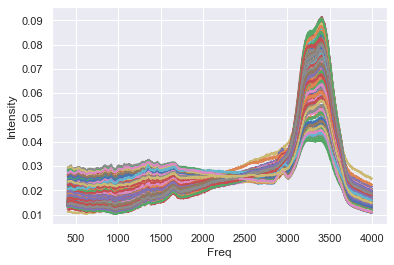

In [9]:
plt.plot(freqs, spectra.T)
plt.xlabel('Freq')
plt.ylabel('Intensity')

#### Distribution of concentrations

There are 21 different values of concentrations.


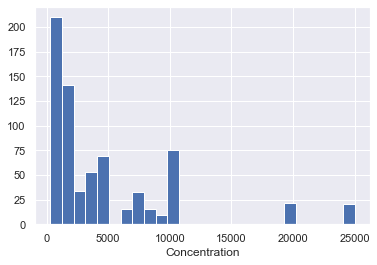

In [10]:
plt.hist(concentration, bins=26)
plt.xlabel('Concentration')
print("There are %s different values of concentrations." % np.unique(concentration).size)

[  300   400   600   800  1000  1400  1600  2000  5000 10000]
[  500  1000  1500  2000  4000  5000  7000 10000 20000 25000]
[ 1000  2000  3000  4000  5000  6000  7000  8000  9000 10000]
[  400   800  1000  1200  1600  2000  3000  4000  5000 10000]


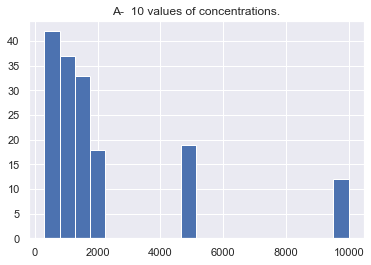

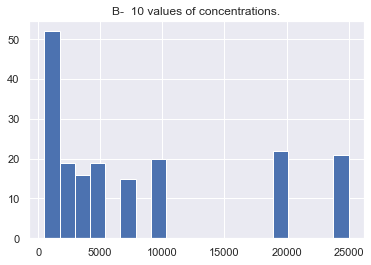

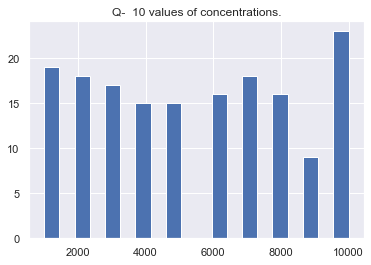

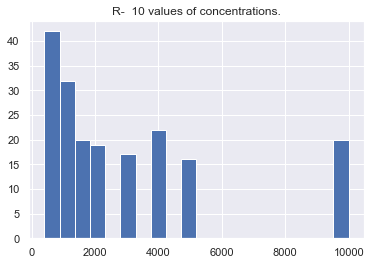

In [11]:
for mol in np.unique(molecule):
    plt.figure()
    plt.hist(concentration[molecule == mol], bins=20)
    plt.title(mol + "-  %s values of concentrations."
              % np.unique(concentration[molecule == mol]).size)
    print(np.unique(concentration[molecule == mol]))

#### Proportion of molecules

Number of samples: 699


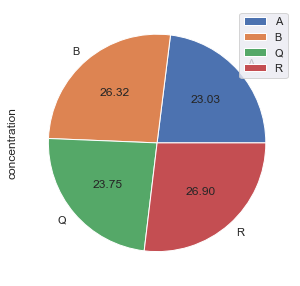

In [12]:
print('Number of samples: %s' % len(y_df))
y_df.groupby('molecule').count().plot(
    y='concentration', kind='pie', autopct='%.2f', figsize=(5, 5));

<Figure size 288x288 with 0 Axes>

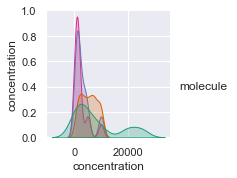

In [40]:
plt.figure(figsize=(4,4))
sns.pairplot(y_df, hue='molecule', palette='Dark2');

In [33]:
y_df.head()

,molecule,concentration
0,B,20000
1,Q,6000
2,R,800
3,R,2000
4,R,10000


#### Proportion of solute groups and vial group

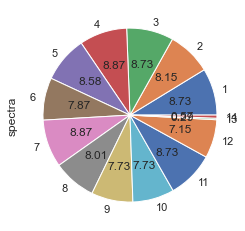

In [13]:
X_df.groupby('solute').count().plot(
    y='spectra', kind='pie', autopct='%.2f', figsize=(4, 4), legend=None);

<AxesSubplot:ylabel='spectra'>

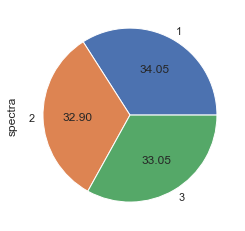

In [14]:
X_df.groupby('vial').count().plot(
    y='spectra', kind='pie',  autopct='%.2f', figsize=(4, 4), legend=None)

#### Mean Raman spectra for each concentration value

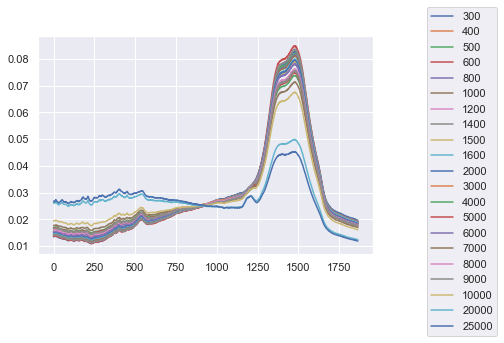

In [15]:
for c in np.unique(concentration):
    plt.plot(np.mean(spectra[concentration == c, :], axis=0), label="%s" % c)

plt.legend(bbox_to_anchor=(1.2, 1),
           bbox_transform=plt.gcf().transFigure);

#### Raman spectra for each type of molecule

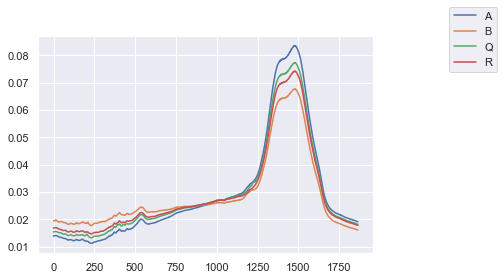

In [16]:
# Mean Raman spectra for each type of molecule
for mol in np.unique(molecule):
    plt.plot(np.mean(spectra[molecule == mol, :], axis=0), label="%s" % mol)

plt.legend(bbox_to_anchor=(1.2, 1),
           bbox_transform=plt.gcf().transFigure);

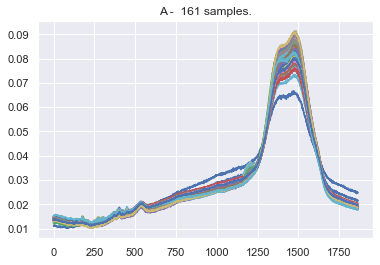

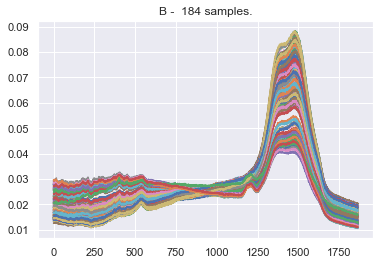

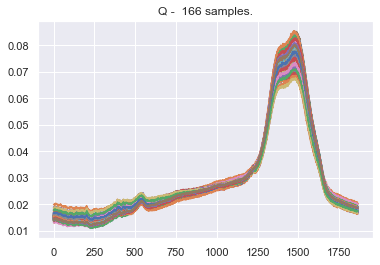

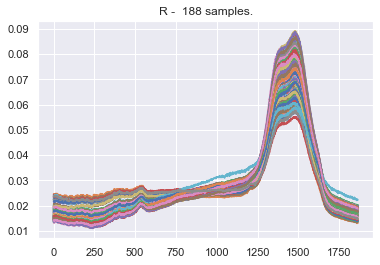

In [17]:
# For each molecule
for mol in np.unique(molecule):
    plt.figure()
    plt.plot(spectra[molecule == mol, :].T)
    plt.title(mol + " -  %s samples." % spectra[molecule == mol, :].shape[0]);

## Your training data set
The files X_train.csv and y_train.csv contain the same data set, but split into the input/output of your models.


## Format 

The submission should be made in the same fashion as the file y_train.csv. It will be made based on the file X_test.csv

In [25]:
import time
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=1)
X_pca = pca.fit_transform(X_df)
PCA_df = pd.DataFrame(data = X_df, columns = ['spectra'])
PCA_df = pd.concat([PCA_df, df['spec']], axis = 1)
PCA_df['spec'] = LabelEncoder().fit_transform(PCA_df['spec'])
PCA_df.head()

In [30]:
y_train.head()

,concentration
630,10000
80,6000
98,500
429,4000
204,2000


## Random Forest

In [18]:
y_df_1 = y_df.drop('molecule',axis=1)

In [94]:
X_df.head()

,solute,spectra,vial
0,6,"[0.0267469, 0.0272395, 0.0268747, 0.0267555, 0...",2
1,11,"[0.015715, 0.0157924, 0.015861, 0.0159583, 0.0...",3
2,3,"[0.0149651, 0.0149305, 0.0147155, 0.0149207, 0...",2
3,12,"[0.015805, 0.0159376, 0.0161405, 0.0159903, 0....",1
4,12,"[0.0220265, 0.0221564, 0.0221778, 0.0221323, 0...",1


In [19]:
from sklearn.model_selection import train_test_split

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X_df, y_df_1, test_size=0.2, random_state=101)

In [21]:
np.unique(map(len, X_train))

array([<map object at 0x00000227B0767B20>], dtype=object)

In [105]:
from sklearn.ensemble import RandomForestClassifier

In [106]:
rf_model = RandomForestClassifier(random_state=101)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

ValueError: setting an array element with a sequence.

## PCA with sklearn

### Scaling Data

In [7]:
from sklearn.preprocessing import StandardScaler

In [8]:
scaler = StandardScaler()

In [ ]:
scaled_X = scaler.fit_transform(X_df)

In [ ]:
df_scaled_X = pd.DataFrame(scaled_X)
plt.figure(figsize = (23, 7))
sns.heatmap(df_scaled_X.corr(), annot = True)

### PCA

In [9]:
from sklearn.decomposition import PCA

In [10]:
pca = PCA(n_components=2)

In [ ]:
principal_components = pca.fit_transform(scaled_X)

In [ ]:
principal_components

In [ ]:
component_df = pd.DataFrame(data = principal_components, columns = ["first_component", 
                                                                    "second_component"])
component_df

In [ ]:
pca.components_

In [ ]:
pca.components_[0]

In [ ]:
pca.components_[1]

In [ ]:
scaled_X[0]

In [ ]:
(scaled_X[0] * pca.components_[0]).sum()

In [ ]:
(scaled_X[0] * pca.components_[1]).sum()

### Corr between component

In [ ]:
sns.pairplot(component_df)

In [ ]:
component_df.corr().round()

### Finding optimal number of components

In [ ]:
pca.explained_variance_ratio_

In [ ]:
pca.explained_variance_ratio_.cumsum()

In [ ]:
pca = PCA().fit(scaled_X)
x = range(1,31)
plt.plot(x, np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Component count")
plt.ylabel("Variance Ratio")

In [ ]:
pca = PCA(n_components=30).fit(scaled_X)

In [ ]:
my_dict = {"explained_variance":pca.explained_variance_, 
        "explained_variance_ratio":pca.explained_variance_ratio_,
        "cumsum_explained_variance_ratio":pca.explained_variance_ratio_.cumsum()}

In [ ]:
pd.DataFrame(my_dict, index = range(1,31))

### Interpreting PCA results

In [ ]:
scaled_df = pd.DataFrame(scaled_X, columns=df.columns)
scaled_df

In [ ]:
combined_df = pd.concat([component_df, scaled_df], axis =1)
correlation = combined_df.corr()

In [ ]:
fig, ax = plt.subplots(figsize=(20, 7))
sns.heatmap(correlation.iloc[:2,2:], cmap='YlGnBu', linewidths=.7, annot=True, fmt='.2f')
plt.show()

In [ ]:
df_scaled_X = pd.DataFrame(scaled_X, columns = df.columns)
plt.figure(figsize = (20, 10))
sns.heatmap(df_scaled_X.corr(), annot = True)

## Train | Test Split and Scaling

In [ ]:
X = df.drop('test_result',axis=1)
y = df['test_result']

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

In [ ]:
scaler = StandardScaler()

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Modelling

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
log_model = LogisticRegression()

In [ ]:
log_model.fit(X_train_scaled, y_train)

In [ ]:
log_model.coef_

In [ ]:
log_model.intercept_

In [ ]:
y_pred = log_model.predict(X_test_scaled)
y_pred

In [ ]:
y_pred_proba = log_model.predict_proba(X_test_scaled)
y_pred_proba

In [ ]:
# X_test + y_yest + y_pred + y_pred_proba

In [ ]:
test_data = pd.concat([X_test, y_test], axis=1)
test_data

In [ ]:
test_data["pred"] = y_pred
test_data

In [ ]:
test_data["pred_proba"] = y_pred_proba[:,1]
test_data

In [ ]:
test_data.sample(10)

## Model Performance on Classification Tasks

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

In [ ]:
confusion_matrix(y_test, y_pred)

In [ ]:
plot_confusion_matrix(log_model, X_test_scaled, y_test);

In [ ]:
plot_confusion_matrix(log_model, X_test_scaled, y_test, normalize='all');

In [ ]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ConfusionMatrix
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(log_model)
# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train_scaled, y_train)
# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test_scaled, y_test)
cm.show()

In [ ]:
print(classification_report(y_test, y_pred))

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.naive_bayes import GaussianNB
from yellowbrick.classifier import ClassificationReport
from yellowbrick.datasets import load_occupancy

visualizer = ClassificationReport(log_model, support=True)
visualizer.fit(X_train_scaled, y_train)        # Fit the visualizer and the model
visualizer.score(X_test_scaled, y_test)        # Evaluate the model on the test data
visualizer.show()

In [ ]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

In [ ]:
accuracy_score(y_test,y_pred)

In [ ]:
log_model.score(X_test_scaled, y_test)

In [ ]:
precision_score(y_test, y_pred)

In [ ]:
recall_score(y_test, y_pred)

In [ ]:
f1_score(y_test,y_pred, average = "weighted")

## Cross Validate

In [ ]:
from sklearn.model_selection import cross_val_score, cross_validate

In [ ]:
model = LogisticRegression()

scores = cross_val_score(model, X_train_scaled, y_train, cv=10)
print('Cross-Validation Mean of Accuracy Scores', scores.mean())
print("")
print(scores)

In [ ]:
model = LogisticRegression()

scores = cross_val_score(model, X_train_scaled, y_train, cv=10, scoring="f1_weighted")
print('Cross-Validation Mean of f1_weighted Scores', scores.mean())
print("")
print(scores)

In [ ]:
import sklearn
sklearn.metrics.SCORERS.keys()

In [ ]:
model = LogisticRegression()

scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

In [ ]:
df_scores.mean()[2:]

## ROC (Receiver Operating Curve) and AUC (Area Under Curve)

In [ ]:
from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

In [ ]:
plot_roc_curve(log_model, X_test_scaled, y_test);

In [ ]:
plot_precision_recall_curve(log_model, X_test_scaled, y_test);

## Final Model and Model Deployment

In [ ]:
scaler = StandardScaler().fit(X)

In [ ]:
import pickle
pickle.dump(scaler, open("scaler_hearing", 'wb'))

In [ ]:
X_scaled = scaler.transform(X)

In [ ]:
final_model = LogisticRegression().fit(X_scaled, y)

In [ ]:
pickle.dump(final_model, open("final_model_hearing", 'wb'))

In [ ]:
my_dict = {"age": [20, 30, 40, 50, 60],
           "physical_score": [50, 30, 20, 10, 5]}

In [ ]:
sample = pd.DataFrame(my_dict)
sample

In [ ]:
scaler_hearing = pickle.load(open("scaler_hearing", "rb"))

In [ ]:
final_model = pickle.load(open("final_model_hearing", "rb"))

In [ ]:
predictions = final_model.predict(sample_scaled)
predictions_proba = final_model.predict_proba(sample_scaled)

In [ ]:
sample["pred"] = predictions
sample["pred_proba"] = predictions_proba[:,1]
sample